# Artificial Intelligence for Cybersecurity Project
**Venturini Francesco** No. 548415

In [1]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from sklearn.feature_selection import SelectKBest, chi2

from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score, f1_score

# Dataset description and Goal
The dataset that has been chosen for the project is the **`UNSW-NB15`  dataset**, created by the IXIA PerfectStorm tool 
in the Cyber Range Lab of the Australian Centre for Cyber Security (ACCS) for generating a 
hybrid of real modern normal activities and synthetic contemporary attack behaviours. Tcpdump 
tool is utilised to capture 100 GB of the raw traffic (e.g., Pcap files). This data set has nine 
families of attacks, namely, `Fuzzers`, `Analysis`, `Backdoors`, `DoS`, `Exploits`, `Generic`, 
`Reconnaissance`, `Shellcode` and `Worms`. The Argus, Bro-IDS tools are utilised and twelve 
algorithms are developed to generate totally 49 features with the class label. These features are 
described in `UNSW-NB15_freatures.csv` file. The total number of records is two millions and 
540,044 which are stored in the four CSV files, namely, `UNSW-NB15_1.csv`, `UNSW-NB15_2.csv`, `UNSW-NB15_3.csv` and `UNSW-NB15_4.csv`. The ground truth table is named 
`UNSW-NB15_GT.csv` and the list of event file is called `UNSW-NB15_LIST_EVENTS.csv`. A
partition from this data set is configured as a training set and testing set, namely, 
`UNSW_NB15_training-set.csv` and `UNSW_NB15_testing-set.csv` respectively. The number of 
records in the training set is 82,332 records and the testing set is 175,341 records.

Input data files are available in the `datasets/UNSW-NB15` directory. The next cell will list all files under this directory.

The goal of the project is to devise a general classifier that categorizes each individual sample as 'attack' or 'normal' network traffic. The objective is to correctly develop a complete Knowledge Discovery from Data process (aka Data Mining). In parallel, a study of a multi-class classification problem was done, based on 10 types of attack categories. The work should produce good performance metrics that will be validated, evaluated and compared with existent works.

The followed procedure is the classical one of the Data Mining process, thus:

1) **Data acquisition and exploration**: first phase with data harvesting and visualization

2) **Data cleaning**: duplicate removal, missing values manage, erroneous data and other problems that affect data quality

3) **Data selection and Data preparation**: correlation analysis, feature selection, transformations, one-hot encoding, normalization

4) **Data modelling (classification)**: applying machine learning and data mining algorithms to build models that describes the data

5) **Validation and Evaluation**: statistical validation tests and metrics

6) **Results interpretation**


# 1. Data Acquisition and Exlporation

Pandas utilities are used to retireve the dataset from the CSV files. The result of read_csv is stored into a DataFrame data structure, e.g., a two-dimensional table-like form. 

In [2]:
for dirname, _, filenames in os.walk('../datasets/UNSW-NB15/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))
        
dataset_root = '../datasets/UNSW-NB15/'

# test and train are switched
test = pd.read_csv(dataset_root + 'a part of training and testing set/UNSW_NB15_training-set.csv')
train = pd.read_csv(dataset_root + 'a part of training and testing set/UNSW_NB15_testing-set.csv')

# otherwise UTF-8 decoding error, Windows codepage 1252 is used
features = pd.read_csv(dataset_root + 'UNSW-NB15_features.csv', encoding='cp1252').set_index('No.') 
list_events = pd.read_csv(dataset_root + 'UNSW-NB15_LIST_EVENTS.csv')

# train and test set concatenation
train['type'] = 'train'
test['type'] = 'test'
df_total = pd.concat([train, test], axis=0, ignore_index=True)

# allow to see complete outputs
pd.set_option('display.max_columns', None) 
df_total

../datasets/UNSW-NB15/The UNSW-NB15 description.pdf
../datasets/UNSW-NB15/UNSW-NB15_1.csv
../datasets/UNSW-NB15/UNSW-NB15_2.csv
../datasets/UNSW-NB15/UNSW-NB15_3.csv
../datasets/UNSW-NB15/UNSW-NB15_4.csv
../datasets/UNSW-NB15/UNSW-NB15_features.csv
../datasets/UNSW-NB15/UNSW-NB15_GT.csv
../datasets/UNSW-NB15/UNSW-NB15_LIST_EVENTS.csv
../datasets/UNSW-NB15/a part of training and testing set\UNSW_NB15_testing-set.csv
../datasets/UNSW-NB15/a part of training and testing set\UNSW_NB15_training-set.csv


,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
0,1,0.121478,tcp,-,FIN,6,4,258,172,74.087490,252,254,1.415894e+04,8495.365234,0,0,24.295600,8.375000,30.177547,11.830604,255,621772692,2202533631,255,0.000000,0.000000,0.000000,43,43,0,0,1,0,1,1,1,1,0,0,0,1,1,0,Normal,0,train
1,2,0.649902,tcp,-,FIN,14,38,734,42014,78.473372,62,252,8.395112e+03,503571.312500,2,17,49.915000,15.432865,61.426934,1387.778330,255,1417884146,3077387971,255,0.000000,0.000000,0.000000,52,1106,0,0,43,1,1,1,1,2,0,0,0,1,6,0,Normal,0,train
2,3,1.623129,tcp,-,FIN,8,16,364,13186,14.170161,62,252,1.572272e+03,60929.230470,1,6,231.875571,102.737203,17179.586860,11420.926230,255,2116150707,2963114973,255,0.111897,0.061458,0.050439,46,824,0,0,7,1,2,1,1,3,0,0,0,2,6,0,Normal,0,train
3,4,1.681642,tcp,ftp,FIN,12,12,628,770,13.677108,62,252,2.740179e+03,3358.622070,1,3,152.876547,90.235726,259.080172,4991.784669,255,1107119177,1047442890,255,0.000000,0.000000,0.000000,52,64,0,0,1,1,2,1,1,3,1,1,0,2,1,0,Normal,0,train
4,5,0.449454,tcp,-,FIN,10,6,534,268,33.373826,254,252,8.561499e+03,3987.059814,2,1,47.750333,75.659602,2415.837634,115.807000,255,2436137549,1977154190,255,0.128381,0.071147,0.057234,53,45,0,0,43,1,2,2,1,40,0,0,0,2,39,0,Normal,0,train
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257668,82328,0.000005,udp,-,INT,2,0,104,0,200000.005100,254,0,8.320000e+07,0.000000,0,0,0.005000,0.000000,0.000000,0.000000,0,0,0,0,0.000000,0.000000,0.000000,52,0,0,0,1,2,2,1,1,2,0,0,0,2,1,0,Normal,0,test
257669,82329,1.106101,tcp,-,FIN,20,8,18062,354,24.410067,254,252,1.241044e+05,2242.109863,7,1,55.880051,143.700000,4798.130981,190.980813,255,1072535109,3284291478,255,0.173208,0.100191,0.073017,903,44,0,0,1,1,2,1,1,1,0,0,0,3,2,0,Normal,0,test
257670,82330,0.000000,arp,-,INT,1,0,46,0,0.000000,0,0,0.000000e+00,0.000000,0,0,60000.720000,0.000000,0.000000,0.000000,0,0,0,0,0.000000,0.000000,0.000000,46,0,0,0,1,2,1,1,1,1,0,0,0,1,1,1,Normal,0,test
257671,82331,0.000000,arp,-,INT,1,0,46,0,0.000000,0,0,0.000000e+00,0.000000,0,0,60000.732000,0.000000,10.954518,0.000000,0,0,0,0,0.000000,0.000000,0.000000,46,0,0,0,1,2,1,1,1,1,0,0,0,1,1,1,Normal,0,test


Above it is possible to see an extract of the dataset, starting to know how the dataset looks like. Let's see the dimensionalities:

In [3]:
print(f"Training set shape: {train.shape}\n")
print(f"Test set shape: {test.shape}\n")
print(f"Total set shape: {df_total.shape}\n")

Training set shape: (175341, 46)

Test set shape: (82332, 46)

Total set shape: (257673, 46)



In [4]:
# thanks to https://www.kaggle.com/code/khairulislam/unsw-nb15-eda?scriptVersionId=27690564&cellId=8
from pandas.api.types import is_datetime64_any_dtype as is_datetime
from pandas.api.types import is_categorical_dtype
def reduce_mem_usage(df, use_float16=False):
    """ iterate through all the columns of a dataframe and modify the data type
        to reduce memory usage.        
    """
    start_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage of dataframe is {:.2f} MB'.format(start_mem))
    
    for col in df.columns:
        if is_datetime(df[col]) or is_categorical_dtype(df[col]):
            # skip datetime type or categorical type
            continue
        col_type = df[col].dtype
        
        if col_type != object:
            c_min = df[col].min()
            c_max = df[col].max()
            if str(col_type)[:3] == 'int':
                if c_min > np.iinfo(np.int8).min and c_max < np.iinfo(np.int8).max:
                    df[col] = df[col].astype(np.int8)
                elif c_min > np.iinfo(np.int16).min and c_max < np.iinfo(np.int16).max:
                    df[col] = df[col].astype(np.int16)
                elif c_min > np.iinfo(np.int32).min and c_max < np.iinfo(np.int32).max:
                    df[col] = df[col].astype(np.int32)
                elif c_min > np.iinfo(np.int64).min and c_max < np.iinfo(np.int64).max:
                    df[col] = df[col].astype(np.int64)  
            else:
                if use_float16 and c_min > np.finfo(np.float16).min and c_max < np.finfo(np.float16).max:
                    df[col] = df[col].astype(np.float16)
                elif c_min > np.finfo(np.float32).min and c_max < np.finfo(np.float32).max:
                    df[col] = df[col].astype(np.float32)
                else:
                    df[col] = df[col].astype(np.float64)
        else:
            df[col] = df[col].astype('object')
    end_mem = df.memory_usage().sum() / 1024**2
    print('Memory usage after optimization is: {:.2f} MB'.format(end_mem))
    print('Decreased by {:.1f}%'.format(100 * (start_mem - end_mem) / start_mem))
    
    return df

df_total = reduce_mem_usage(df_total)

Memory usage of dataframe is 90.43 MB
Memory usage after optimization is: 37.11 MB
Decreased by 59.0%


## 1.1 Feature statistics 

Attack categories:

In [72]:
list_events['Attack category'].unique()

array(['normal', ' Fuzzers ', ' Fuzzers', ' Reconnaissance ',
       ' Shellcode ', 'Analysis', 'Backdoors', 'DoS', 'Exploits',
       'Generic', 'Reconnaissance', 'Shellcode', 'Worms', nan],
      dtype=object)

Attack subcategories: 

In [6]:
list_events['Attack subcategory'].unique()

array([nan, 'FTP', 'HTTP', 'RIP', 'SMB', 'Syslog', 'PPTP', ' FTP',
       'DCERPC', 'OSPF', 'TFTP', ' DCERPC ', ' OSPF', 'BGP', 'Telnet',
       'SNMP', ' SunRPC Portmapper (TCP) UDP Service',
       ' SunRPC Portmapper (TCP) TCP Service ',
       'SunRPC Portmapper (UDP) UDP Service', 'NetBIOS', 'DNS',
       'SunRPC Portmapper (UDP)', ' ICMP', ' SCTP', 'MSSQL', 'SMTP',
       'FreeBSD', 'HP-UX ', 'NetBSD ', 'AIX', 'SCO Unix', 'Linux',
       'Decoders', 'IRIX', 'OpenBSD', ' Mac OS X', 'BSD', 'Windows',
       'BSDi', 'Multiple OS', 'Solaris', 'HTML', 'Port Scanner', 'Spam ',
       ' ', ' Ethernet', ' Microsoft Office', ' VNC', 'IRC', 'RDP', 'TCP',
       'VNC', ' LDAP', ' Oracle ', ' TCP', ' TFTP', 'XINETD', ' IRC',
       ' SNMP', 'ISAKMP', 'NTP', 'CUPS', 'Hypervisor', 'ICMP', 'SunRPC',
       ' IMAP', 'Asterisk', 'Browser', 'Cisco Skinny', 'SIP', 'SSL',
       ' SMTP', 'IIS Web Server', 'Miscellaneous', 'RTSP',
       ' Common Unix Print System (CUPS)', ' SunRPC', 'IGMP',
       '

The features and the relative descriptions are in the next cell. Note that `srcip`, `sport`, `dstip`, `dsport` are not present in the training set. 

In [7]:
# actually 45+1 (id) are present in the dataset
features.head(features.shape[0]) 

,Name,Type,Description
No.,,,
1,srcip,nominal,Source IP address
2,sport,integer,Source port number
3,dstip,nominal,Destination IP address
4,dsport,integer,Destination port number
5,proto,nominal,Transaction protocol
6,state,nominal,Indicates to the state and its dependent proto...
7,dur,Float,Record total duration
8,sbytes,Integer,Source to destination transaction bytes
9,dbytes,Integer,Destination to source transaction bytes


Print some information on the individual attributes, checking also the number of null instances:


In [8]:
for i, col_name in enumerate(train.columns):  
  print("{0:16}".format(col_name), " \tn_unique = {0:6}".format(train[col_name].nunique()), 
        "---> {0:5}%".format(round((100*train[col_name].nunique()/len(train[col_name])),2)),
        "\tnull_count = {}".format(train[col_name].isnull().sum())) 

id                	n_unique = 175341 ---> 100.0% 	null_count = 0
dur               	n_unique =  74039 ---> 42.23% 	null_count = 0
proto             	n_unique =    133 --->  0.08% 	null_count = 0
service           	n_unique =     13 --->  0.01% 	null_count = 0
state             	n_unique =      9 --->  0.01% 	null_count = 0
spkts             	n_unique =    480 --->  0.27% 	null_count = 0
dpkts             	n_unique =    443 --->  0.25% 	null_count = 0
sbytes            	n_unique =   7214 --->  4.11% 	null_count = 0
dbytes            	n_unique =   6660 --->   3.8% 	null_count = 0
rate              	n_unique =  76991 ---> 43.91% 	null_count = 0
sttl              	n_unique =     11 --->  0.01% 	null_count = 0
dttl              	n_unique =      6 --->   0.0% 	null_count = 0
sload             	n_unique =  80885 ---> 46.13% 	null_count = 0
dload             	n_unique =  77474 ---> 44.18% 	null_count = 0
sloss             	n_unique =    409 --->  0.23% 	null_count = 0
dloss             	n_uniq

Let's see the description of the features (including non-numerical attributes)

In [9]:
train.describe(include='all') 

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
count,175341.000000,175341.000000,175341,175341,175341,175341.000000,175341.000000,1.753410e+05,1.753410e+05,1.753410e+05,175341.000000,175341.000000,1.753410e+05,1.753410e+05,175341.000000,175341.000000,175341.000000,175341.000000,1.753410e+05,175341.000000,175341.000000,1.753410e+05,1.753410e+05,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,1.753410e+05,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341.000000,175341,175341.000000,175341
unique,NaN,NaN,133,13,9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10,NaN,1
top,NaN,NaN,tcp,-,INT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Normal,NaN,train
freq,NaN,NaN,79946,94168,82275,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,56000,NaN,175341
mean,87671.000000,1.359389,NaN,NaN,NaN,20.298664,18.969591,8.844844e+03,1.492892e+04,9.540619e+04,179.546997,79.609567,7.345403e+07,6.712056e+05,4.953000,6.948010,985.976864,88.216296,4.976254e+03,604.353826,116.257339,9.692504e+08,9.688770e+08,115.013625,0.041396,0.021020,0.020375,136.751769,124.173382,0.105982,2.144292e+03,9.306437,1.304179,6.193936,5.383538,4.206255,8.729881,0.014948,0.014948,0.133066,6.955789,9.100758,0.015752,NaN,0.680622,NaN
std,50616.731112,6.480249,NaN,NaN,NaN,136.887597,110.258271,1.747656e+05,1.436542e+05,1.654010e+05,102.940011,110.506863,1.883574e+08,2.421312e+06,66.005059,52.732999,7242.245841,987.093195,4.496585e+04,4061.043281,127.001024,1.355264e+09,1.354000e+09,126.886530,0.079354,0.043400,0.040506,204.677360,258.317056,0.776911,5.420797e+04,10.704331,0.954406,8.052476,8.047104,5.783585,10.956186,0.126048,0.126048,0.701208,8.321493,10.756952,0.124516,NaN,0.466237,NaN
min,1.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.800000e+01,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,28.000000,0.000000,0.000000,0.000000e+00,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,NaN,0.000000,NaN
25%,43836.000000,0.000008,NaN,NaN,NaN,2.000000,0.000000,1.140000e+02,0.000000e+00,3.278614e+01,62.000000,0.000000,1.305334e+04,0.000000e+00,0.000000,0.000000,0.008000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000,0.000000,0.000000e+00,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,2.000000,2.000000,0.000000,NaN,0.000000,NaN
50%,87671.000000,0.001582,NaN,NaN,NaN,2.000000,2.000000,4.300000e+02,1.640000e+02,3.225807e+03,254.000000,29.000000,8.796748e+05,1.447023e+03,0.000000,0.000000,0.279733,0.006000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,73.000000,44.000000,0.000000,0.000000e+00,5.000000,1.000000,2.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,3.000000,4.000000,0.000000,NaN,1.000000,NaN
75%,131506.000000,0.668069,NaN,NaN,NaN,12.000000,10.000000,1.418000e+03,1.102000e+03,1.250000e+05,254.000000,252.000000,8.888889e+07,2.784487e+04,3.000000,2.000000,55.156896,51.053000,2.513295e+03,114.990625,255.00


We can take a look at the training data class distribution (binary and 10 classes breakdown):

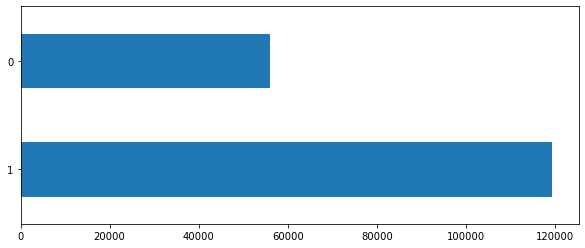

In [10]:
train_label = train['label'].value_counts()
train_label.plot(kind='barh', figsize=(10,4), fontsize=10);

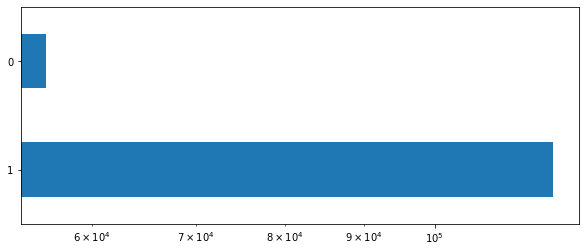

In [11]:
# logarithmic scale
train_label.plot(kind='barh', logx=True, figsize=(10,4), fontsize=10);

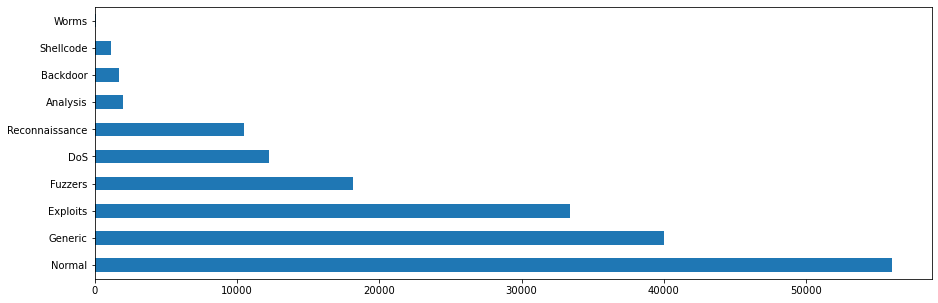

In [12]:
train_attack_cats = train['attack_cat'].value_counts()
train_attack_cats.plot(kind='barh', figsize=(15,5), fontsize=10);

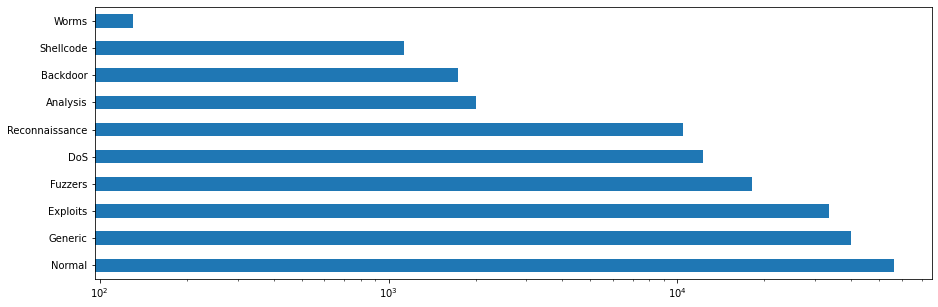

In [13]:
# the same plots as before in a logarithmic representation:
train_attack_cats.plot(kind='barh', logx=True, figsize=(15,5), fontsize=10);

One obvious observation is that the classes are tremendously imbalanced for the multiclass problem. For instance, the `Worms` class is smaller than the `Exploits` class. If we ignore this class imbalance and use the training data as is, there is a chance that the model will learn a lot more about, e.g., the `Normal` and the `Generic` classes compared to the `Worms` and `Shellcode` classes, which can result in an undesirable bias in the classifier. 
The same can be said for the binary classification problem. 

#### Data visualization
Now, let's take a look at some data. Data visualization provides many additional techniques for viewing data through graphical means. These can help in identifying relations, trends, and biases "hidden" in unstructured data sets. 

C:\Users\Francesco\AppData\Local\Temp\ipykernel_15432\3080312487.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (14, 3))


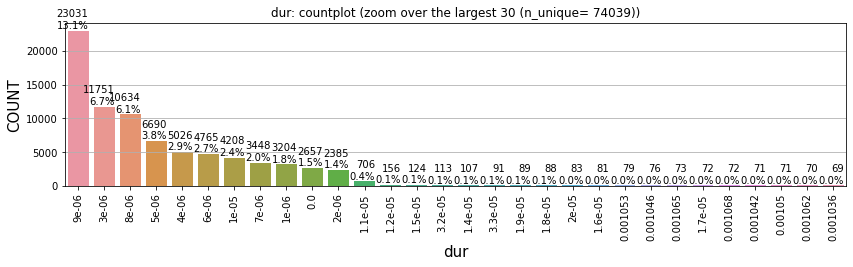

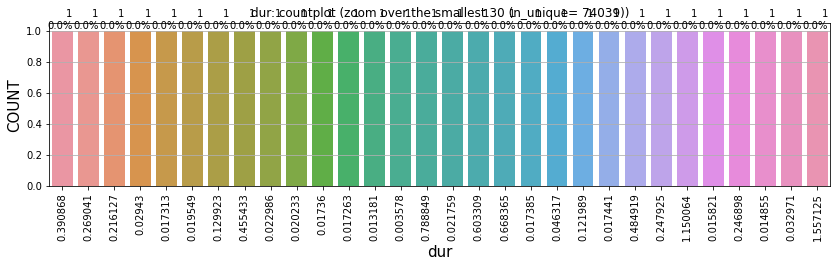

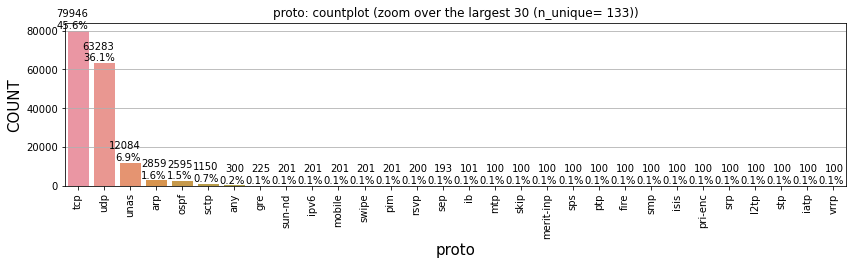

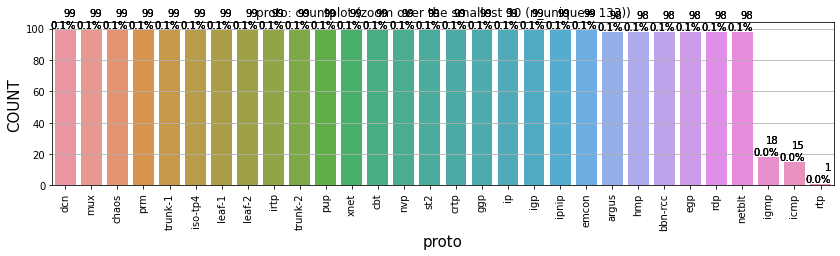

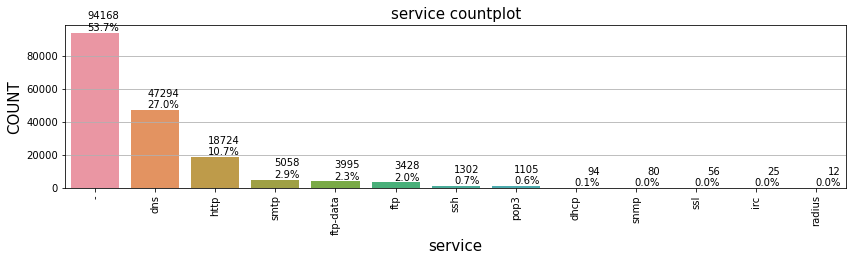

...

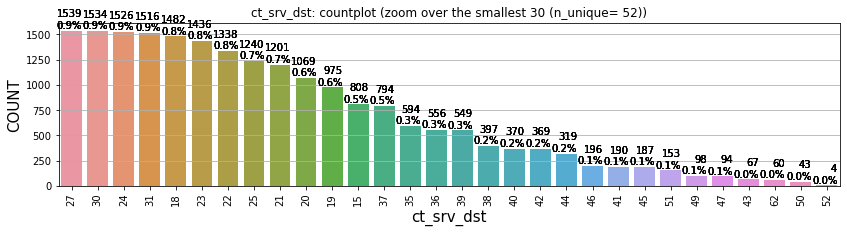

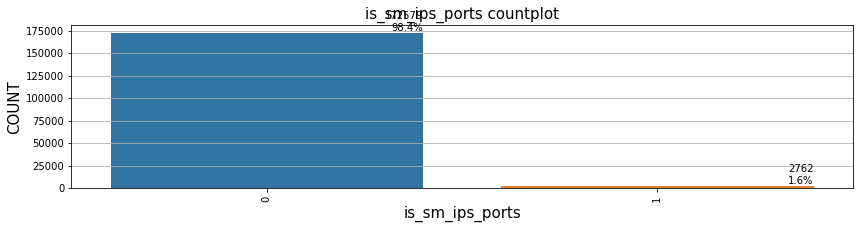

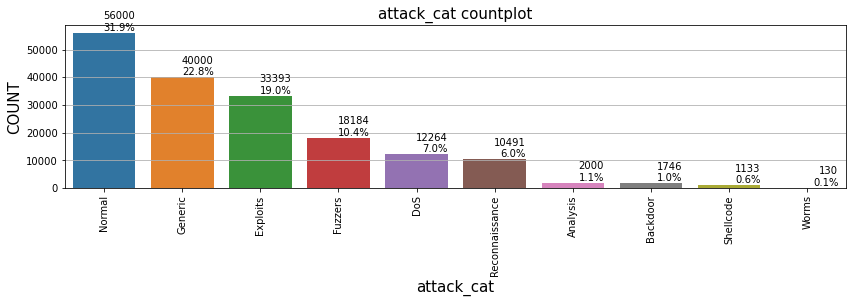

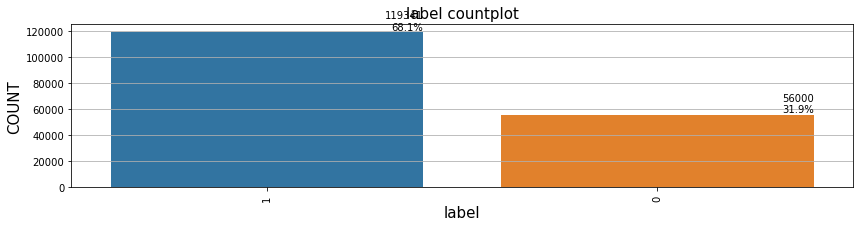

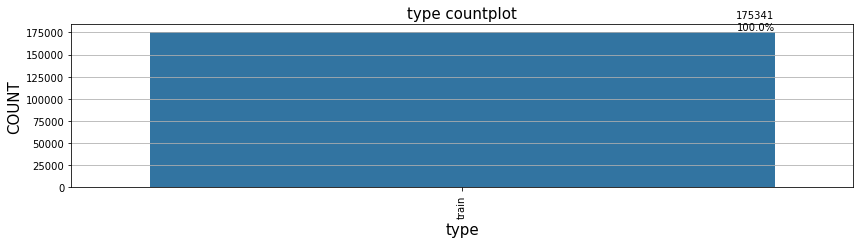

In [14]:
df_to_plot = train.copy().drop(['id'], axis=1)
df_columns = df_to_plot.columns

for i, var in enumerate(df_columns):
    max_largest = 30

    largest = min(max_largest, df_to_plot[var].nunique())
    n_nunique_var = df_to_plot[var].nunique()
    tot = len(df_to_plot[var])
    n_null = df_to_plot[var].isnull().sum() 

    plt.figure(figsize = (14, 3))
    ax = sns.countplot(x=var, order=df_to_plot[var].value_counts().iloc[:largest].index, data=df_to_plot)
    plt.xticks(rotation=90, fontsize=10)
    plt.yticks(fontsize = 10)
    plt.xlabel(var, fontsize = 15)
    plt.ylabel('COUNT', fontsize = 15)

    if max_largest == largest:
        plt.title(f'{var}: countplot (zoom over the largest {largest} (n_unique= {n_nunique_var}))', fontsize = 12)
    else:
        plt.title(f'{var} countplot', fontsize = 15)

    plt.grid(axis = 'y')

    for p in ax.patches:
        percentage = '{:.0f}\n{:.1f}%'.format(p.get_height(), 100 * p.get_height() / len(df_to_plot[var]))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax.annotate(percentage, (x,y), ha='right', va='bottom')

    if max_largest == largest: 
        plt.figure(figsize = (14, 3))
        ax_lower = sns.countplot(x = var, order = df_to_plot[var].value_counts().iloc[-largest:].index, data = df_to_plot)
        plt.xticks(rotation = 90, fontsize = 10)
        plt.yticks(fontsize = 10)
        plt.xlabel(var, fontsize = 15)
        plt.ylabel('COUNT', fontsize = 15)
        plt.title(f'{var}: countplot (zoom over the smallest {largest} (n_unique= {n_nunique_var}))', fontsize = 12)
        plt.grid(axis='y')

    for p in ax_lower.patches:
        percentage = '{:.0f}\n{:.1f}%'.format(p.get_height(), 100 * p.get_height() / len(df_to_plot[var]))
        x = p.get_x() + p.get_width()
        y = p.get_height()
        ax_lower.annotate(percentage, (x,y), ha='right', va='bottom')

Some comments on the distributions: 

- `dur`: skwed to the right, big range of values
- `proto`: skwed to the right, mainly tcp and udp
- `service`: skwed, '-' means else
- `state`: skwed
- `spkts`: skwed, medium range of values 
- `dpkts`: similar distribution of spkts 
- `sbytes`: similar to the distribution above 
- `dbytes`: similar to the distribution above
- `rate`: skwed, big range of values 
- `sttl`: skwed 
- `dttl`: skwed 
- `sload`: fairly balanced in the distribution 
- `dload`: mostly skwed to the right, 0 is the main value 
- `sloss`: similar to sent packets/bytes
- `dloss`: similar to sent received packets/bytes
- `sinpkt`: a bit skwed
- `dinpkt`: skwed  
- `sjit`: mostly skwed
- `djit`: mostly skwed
- `swin`: mainly 0 and 255 
- `dwin`: mainly 0 and 255 
- `stcpb`: half are 0 
- `dtcpb`: half are 0 
- `tcprtt`: half are 0 
- `synack`: half are 0
- `ackdat`: half are 0 
- `smean`: skwed 
- `dmean`: skwed
- `trans_depth`: mostly 0 
- `response_body_len`: mostly 0 
- `ct_srv_src`: a bit skwed 
- `ct_state_ttl`: fairly distributed 
- `ct_dst_ltm`: fairly distributed 
- `ct_src_dport_ltm`: mostly 1
- `ct_dst_sport_ltm`: mostly 1 
- `ct_dst_src_ltm`: a bit skwed 
- `is_ftp_login`: mostly 0
- `ct_ftp_cmd`: mostly 0 
- `ct_flw_http_mthd`: mostly 0
- `ct_src_ltm`: fairly distributed
- `ct_src_dst`: a bit skwed
- `is_sm_ips_port`: mostly 0 

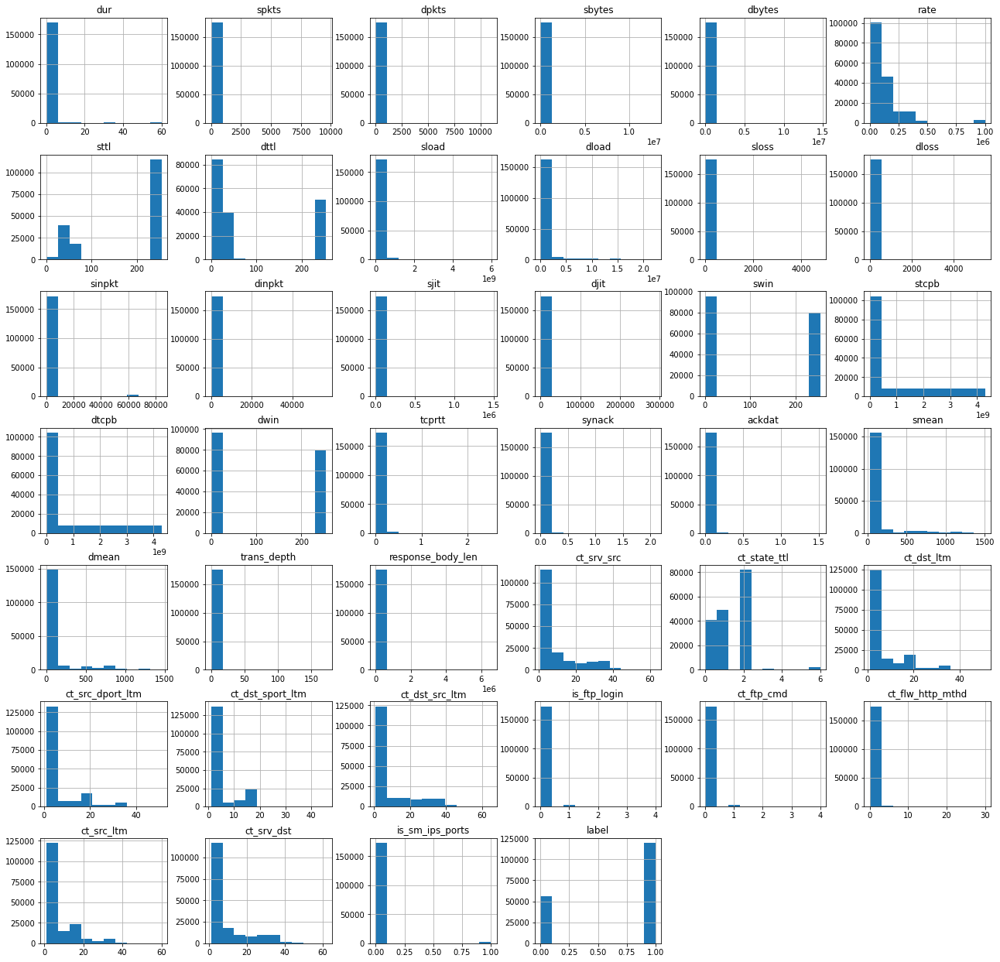

In [71]:
df_to_plot.hist(figsize=(22,22));

## 1.2 Datatypes understanding

In [16]:
# data types of each column, mixed types are stored with the `object` dtype
df_total.dtypes 

id                     int32
dur                  float32
proto                 object
service               object
state                 object
spkts                  int16
dpkts                  int16
sbytes                 int32
dbytes                 int32
rate                 float32
sttl                   int16
dttl                   int16
sload                float32
dload                float32
sloss                  int16
dloss                  int16
sinpkt               float32
dinpkt               float32
sjit                 float32
djit                 float32
swin                   int16
stcpb                  int64
dtcpb                  int64
dwin                   int16
tcprtt               float32
synack               float32
ackdat               float32
smean                  int16
dmean                  int16
trans_depth            int16
response_body_len      int32
ct_srv_src              int8
ct_state_ttl            int8
ct_dst_ltm              int8
ct_src_dport_l

From the previous output, the describe output and the specification of the dataset in the documentation, we can see the presence of:
- 3 categorical features (*proto*, *service*, *state*)
- 2 (asymmetric) binary features (*is_ftp_login*, *is_sm_ips_ports*)
- 2 possible target features (*attack_cat*, *label*)
- the *others* are numerical features (float or int)

## 1.3 An insight on specific attacks
This paragraph it is not aimed at a deep data visualization analysis of the dataset but is useful to understand some insights.  

In [17]:
fuzzers_df = df_total[df_total['attack_cat'] == 'Fuzzers' ]
fuzzers_df.describe(include='all')

,id,dur,proto,service,state,spkts,dpkts,sbytes,dbytes,rate,sttl,dttl,sload,dload,sloss,dloss,sinpkt,dinpkt,sjit,djit,swin,stcpb,dtcpb,dwin,tcprtt,synack,ackdat,smean,dmean,trans_depth,response_body_len,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_src_dport_ltm,ct_dst_sport_ltm,ct_dst_src_ltm,is_ftp_login,ct_ftp_cmd,ct_flw_http_mthd,ct_src_ltm,ct_srv_dst,is_sm_ips_ports,attack_cat,label,type
count,24246.000000,24246.000000,24246,24246,24246,24246.000000,24246.000000,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,2.424600e+04,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,2.424600e+04,24246.000000,24246.000000,2.424600e+04,2.424600e+04,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.000000,24246.0,24246,24246.0,24246
unique,NaN,NaN,129,4,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,NaN,2
top,NaN,NaN,tcp,-,FIN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Fuzzers,NaN,train
freq,NaN,NaN,15474,21980,15461,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,24246,NaN,18184
mean,81532.686175,2.673930,NaN,NaN,NaN,13.764827,6.095686,6.764303e+03,518.772127,67267.070312,253.407944,160.900272,1.276859e+08,3.221342e+03,3.863648,1.152644,410.948029,318.406891,2.159783e+04,846.070251,162.743133,1.368714e+09,1.365963e+09,162.743133,0.098788,0.052170,0.046617,238.826198,38.831601,0.048462,2.734224,6.124557,1.421224,2.527345,2.133548,1.416399,4.412975,0.005857,0.005857,0.063309,3.376557,5.436691,0.0,NaN,1.0,NaN
std,37362.040062,9.441679,NaN,NaN,NaN,34.371893,8.298022,4.294158e+04,5693.725260,142351.781250,11.099163,121.015686,3.599787e+08,1.521265e+04,16.560744,2.522197,2595.423096,1603.147217,1.067143e+05,4766.822754,122.534856,1.427848e+09,1.426568e+09,122.534856,0.088006,0.048489,0.044075,320.664138,50.262911,0.214744,201.497561,6.059497,0.747720,3.135934,2.248636,1.174733,5.422104,0.078438,0.078438,0.344525,4.401981,5.842210,0.0,NaN,0.0,NaN
min,267.000000,0.000000,NaN,NaN,NaN,1.000000,0.000000,2.400000e+01,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,24.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.0,NaN,1.0,NaN
25%,53451.250000,0.000010,NaN,NaN,NaN,2.000000,0.000000,5.320000e+02,0.000000,19.497195,254.000000,0.000000,6.676498e+03,0.000000e+00,0.000000,0.000000,0.010000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,57.000000,0.000000,0.000000,0.000000,3.000000,1.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000,0.000000,1.000000,2.000000,0.0,NaN,1.0,NaN
50%,72993.500000,0.589509,NaN,NaN,NaN,10.000000,6.000000,8.200000e+02,268.000000,33.898212,254.000000,252.000000,1.769602e+04,2.492026e+03,2.000000,1.000000,49.383499,69.468430,2.664123e+03,105.965721,255.000000,9.455292e+08,9.168295e+08,255.000000,0.108917,0.055150,0.048531,91.000000,44.000000,0.000000,0.000000,4.000000,1.000000,2.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,2.000000,4.000000,0.0,NaN,1.0,NaN
75%,104970.250000,1.080940,NaN,NaN,NaN,12.000000,8.000000,1.494000e+03,682.000000,100000.000000,254.000000,252.000000,8.000000e+07,4.427268e+03,3.000000,2.000000,92.156906,118.691534,4.967546e+03,184.254883,255.000000,2.601297e+09,2.603236e+09,255.000000,0.163411,0.085737,0.076118,252.000000,54.000000,0.000000,0.000000,7.000000,2.000000,2.000000,

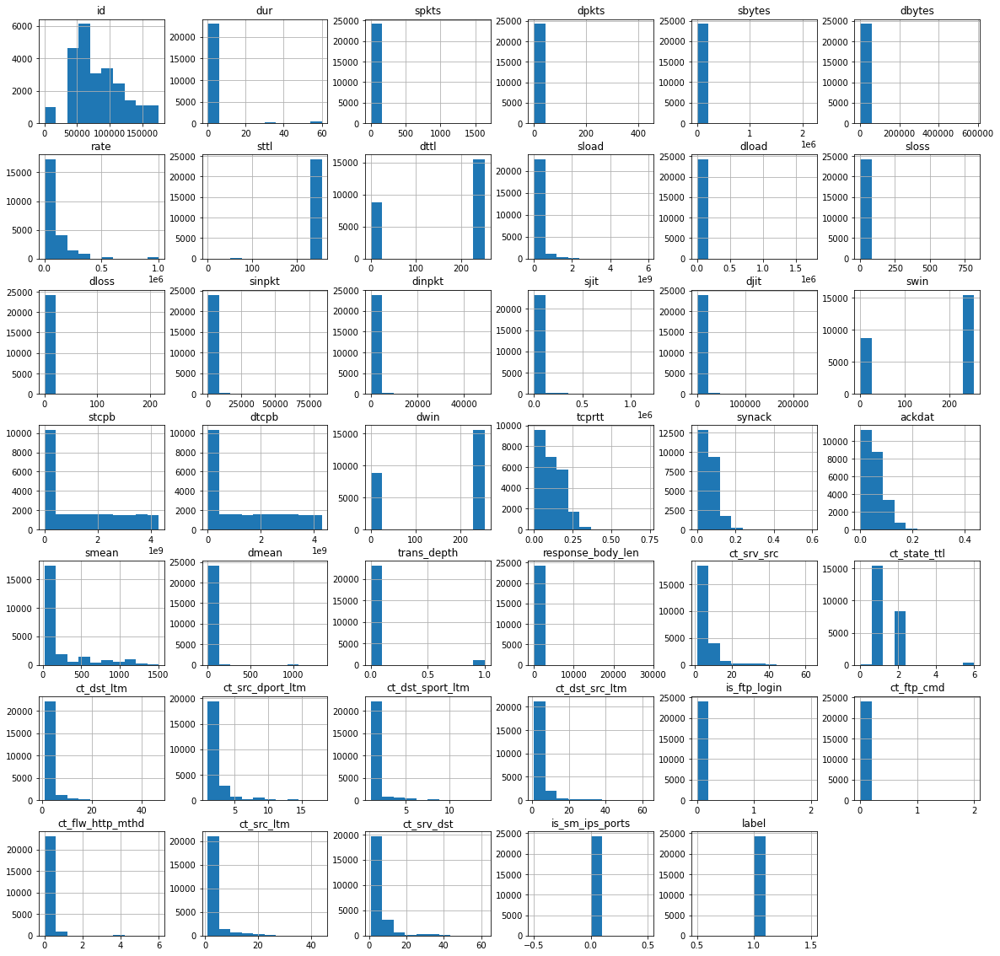

In [18]:
fuzzers_df.hist(figsize=(20,20));

With the general distributions we can spot some differences, like in the values taken in *sttl* and *dttl*. But also, for example, the maximum values of *dur*, *spkts*, *dkpts*, *sbytes*, *dbytes*, and a lot more. 

If we analyse the tendency of two attributes like *is_ftp_login* and *dur* we can, for example, spot that attacks belonging to the `Exploit` category are characterized by a higher value of the former feature (note that the attribute is binary but assumes values higher than 1, data cleaning is a step performed ahead), meanwhile no insights come from the latter one. 

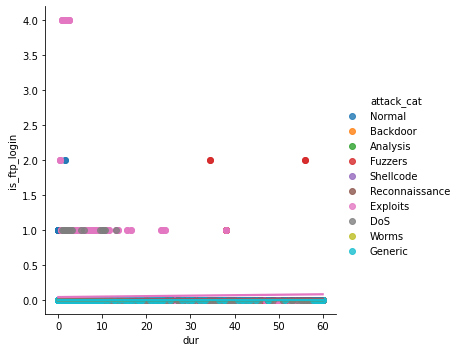

In [19]:
g = sns.lmplot(x="dur", y="is_ftp_login", data=df_total, hue="attack_cat")

With regard to the binary problem and the *attack* label:

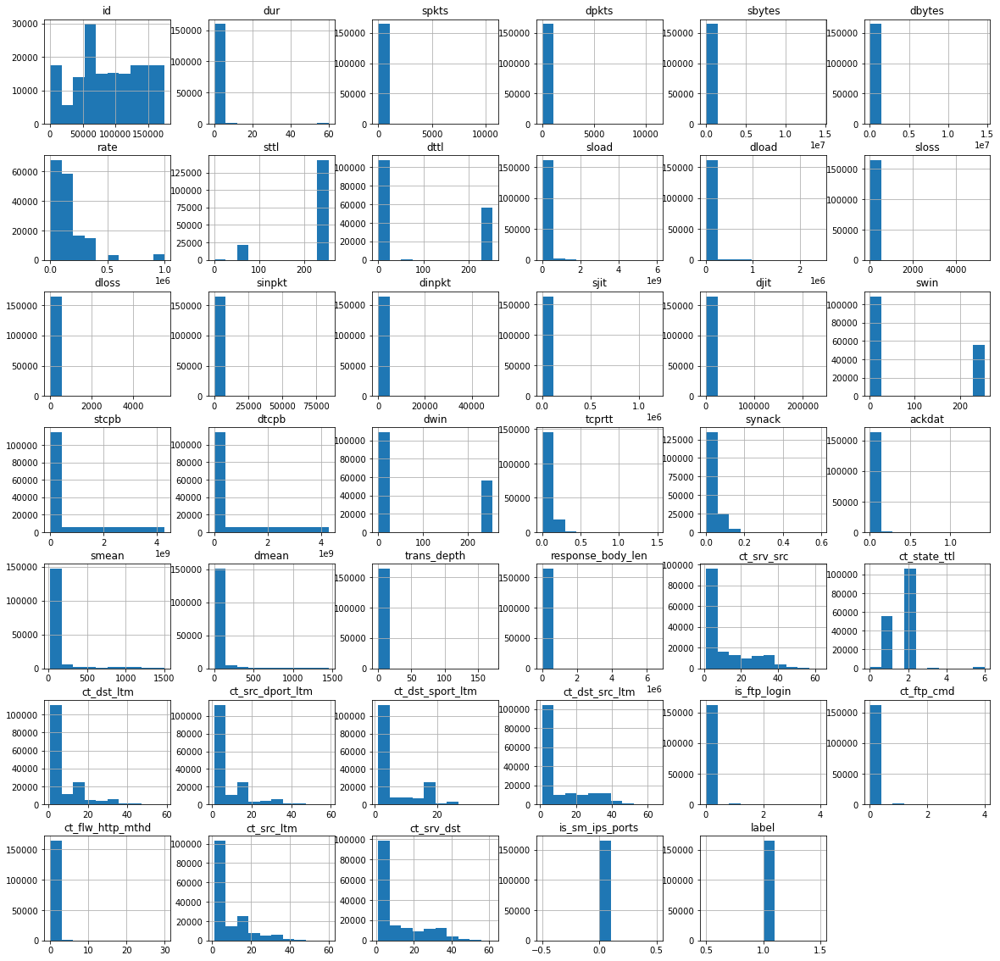

In [20]:
attacks_df = df_total[df_total['label'] == 1]
# attacks_df.describe(include='all')
attacks_df.hist(figsize=(20,20));

We can spot a little difference in the *swin* data distribution, different amplitudes in *stcpb* and *dtcpb*. But also different shapes for *tcprtt*, *synack* and *ackdat*, and so on and so forth. 

Take a look at categorical values for different attack categories:

In [21]:
# pip install -U kaleido

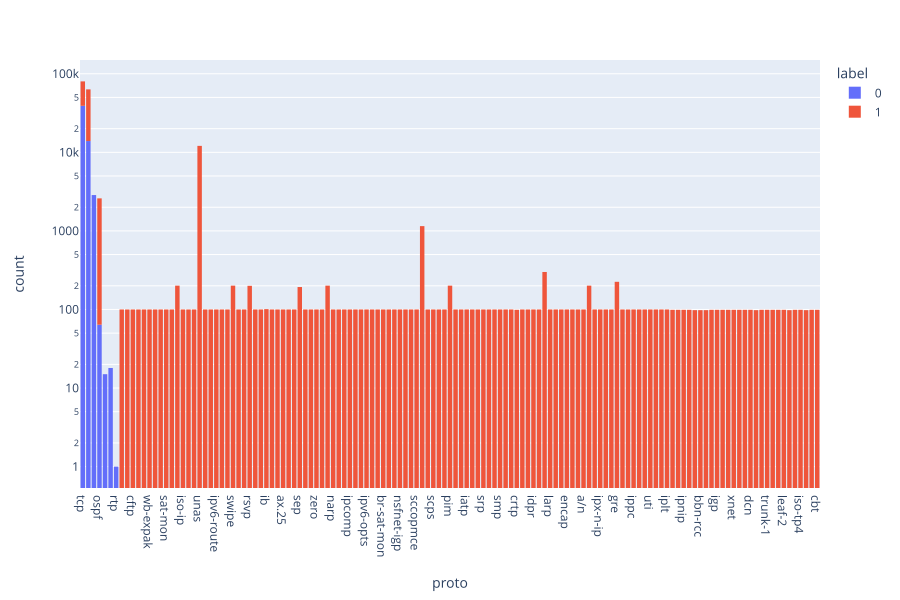

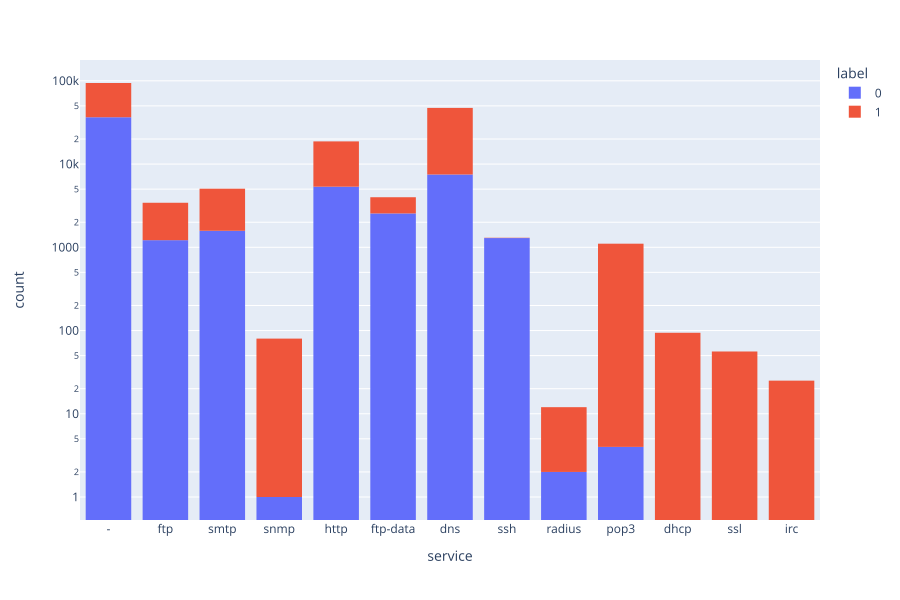

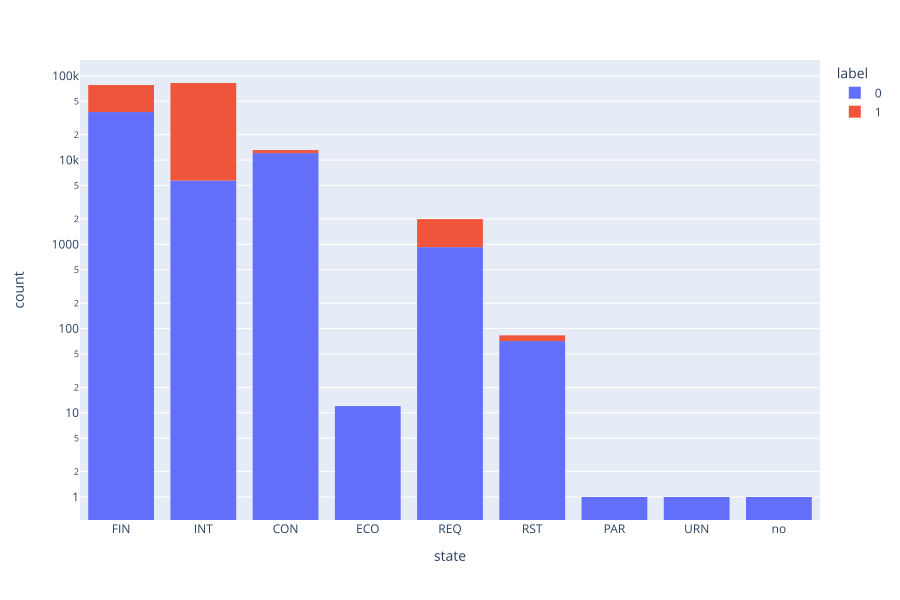

In [23]:
# binary class
for feature in nominal_cols:
    if feature != 'attack_cat' and feature != 'type':
        fig = px.histogram(train, x=feature, log_y=True, color="label")
        fig.show(renderer="svg", width=900, height=600)

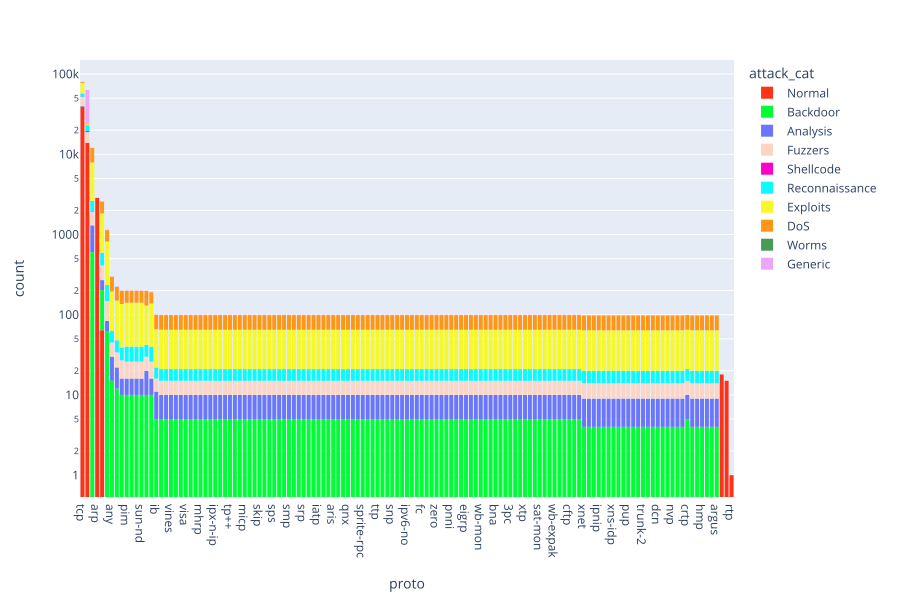

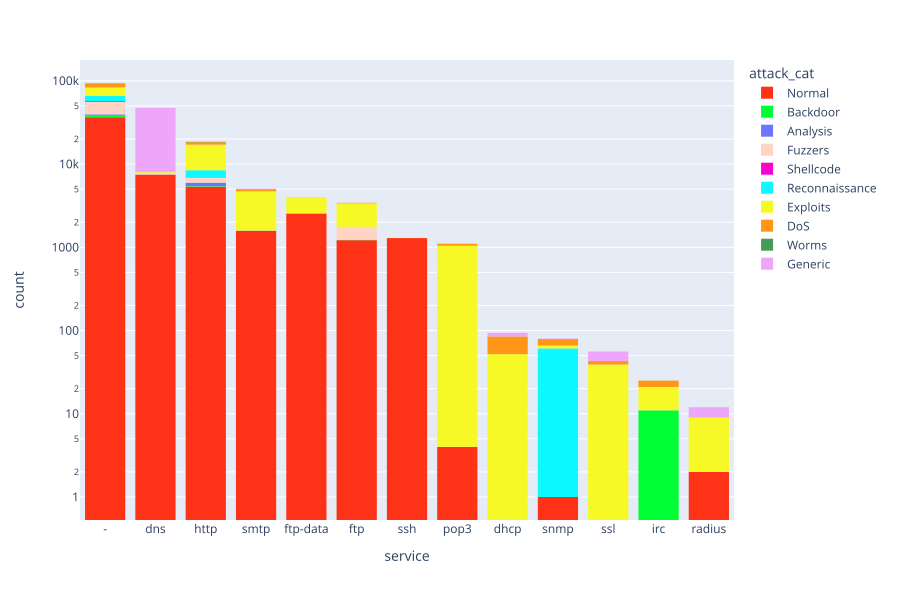

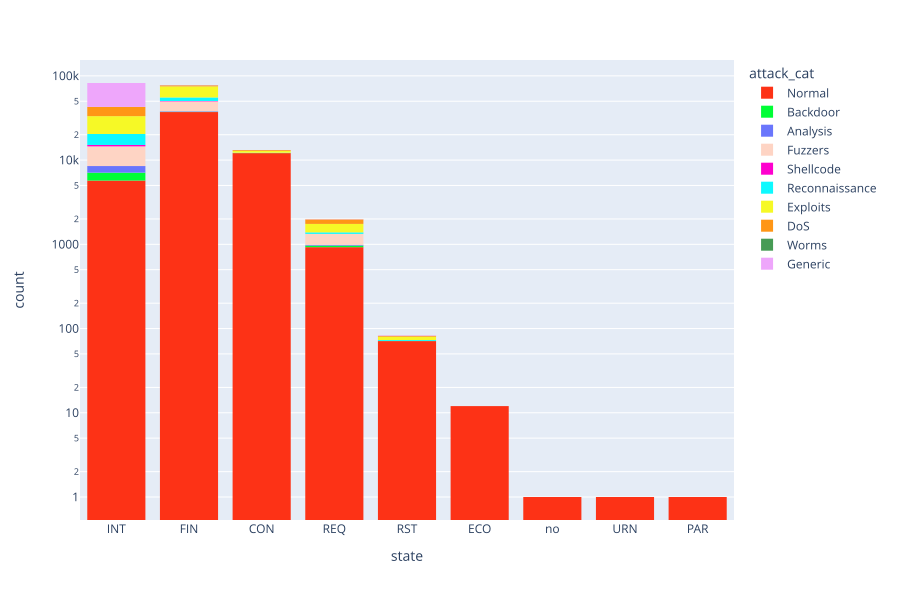

In [22]:
# multiclass
nominal_cols = train.select_dtypes(include='object').columns
for feature in nominal_cols:
    if feature != 'attack_cat' and feature != 'type':
        fig = px.histogram(train, x=feature, log_y=True, color="attack_cat", color_discrete_sequence=px.colors.qualitative.Light24)
        fig.update_layout(xaxis={'categoryorder':'total descending'})
        fig.show(renderer="svg", width=900, height=600)

For example, most of the attacks have a 'particular' protocol type.

Let's do the same for the numeric attributes (only the binary case):

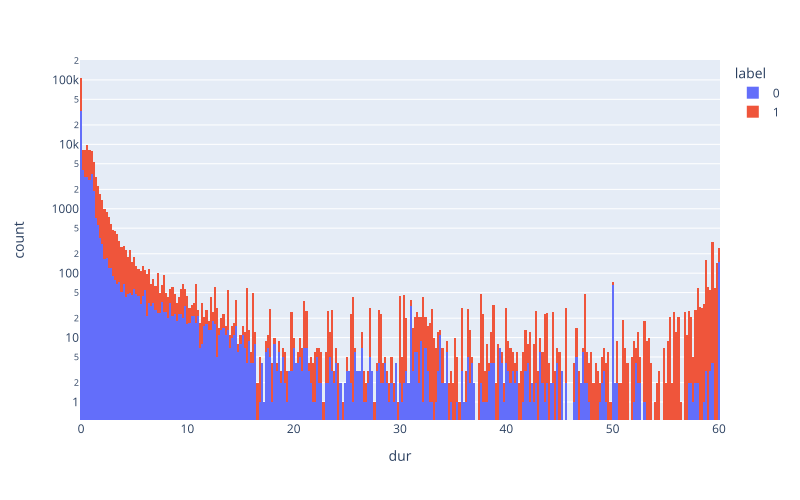

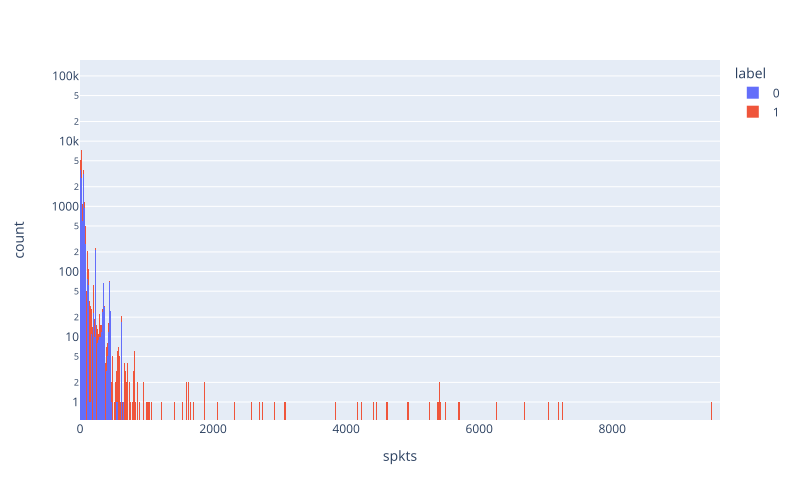

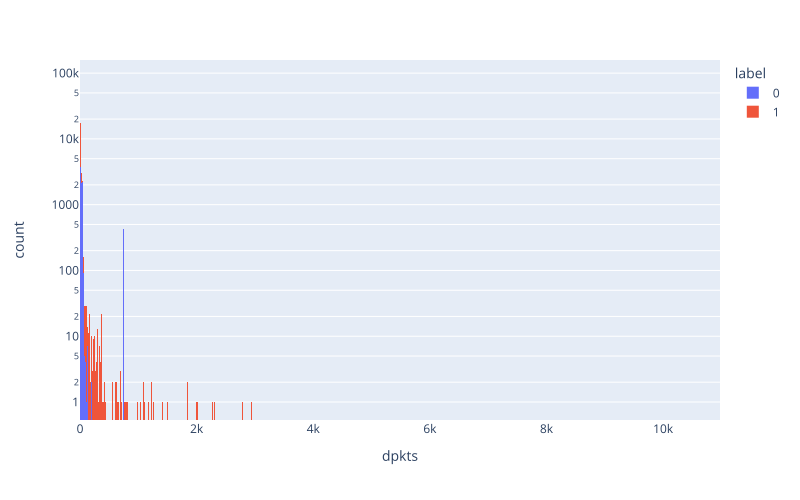

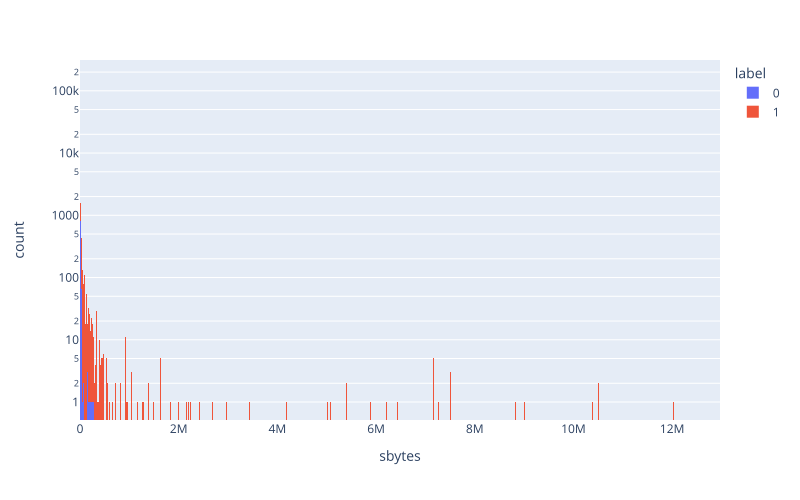

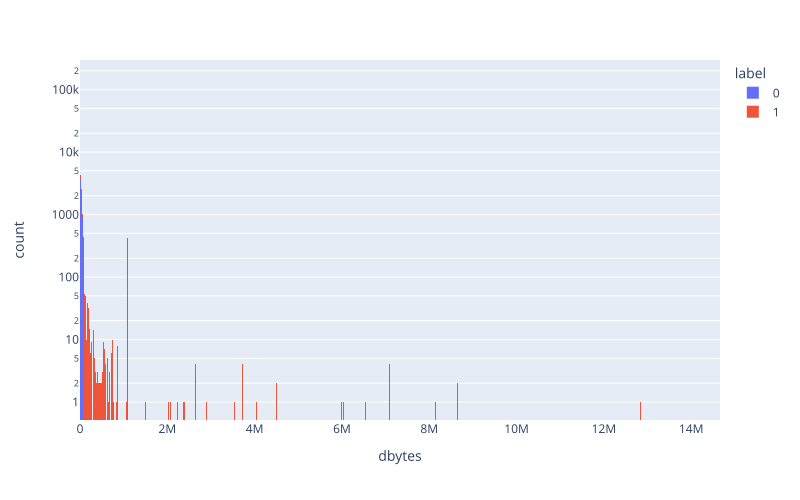

...

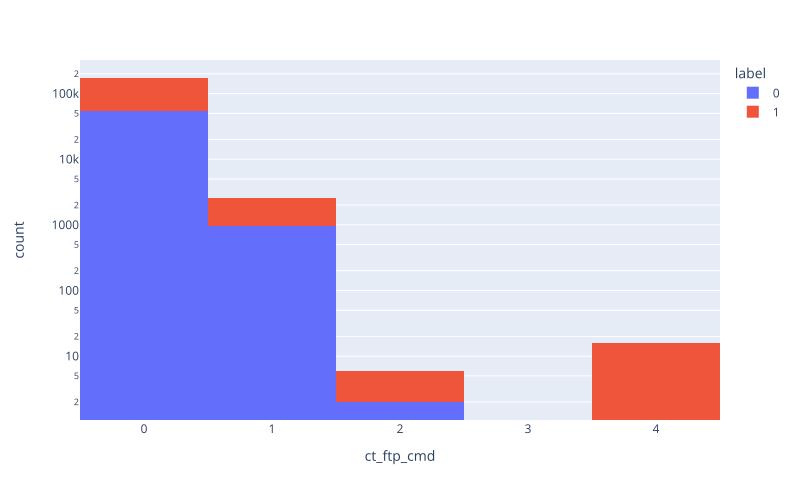

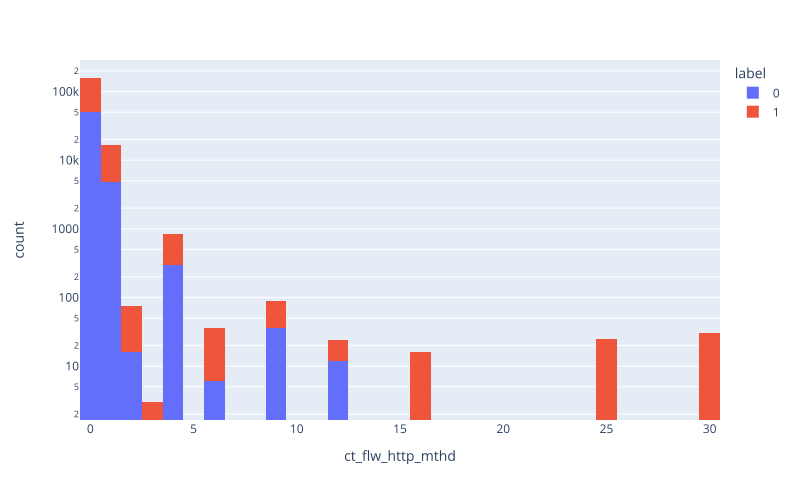

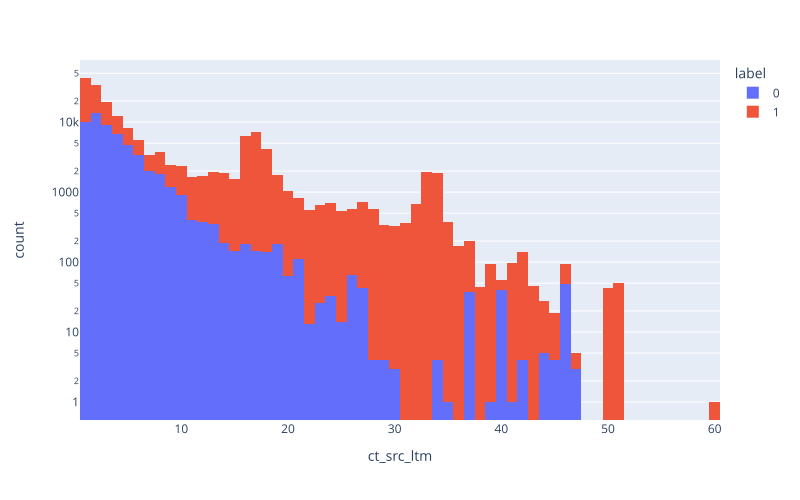

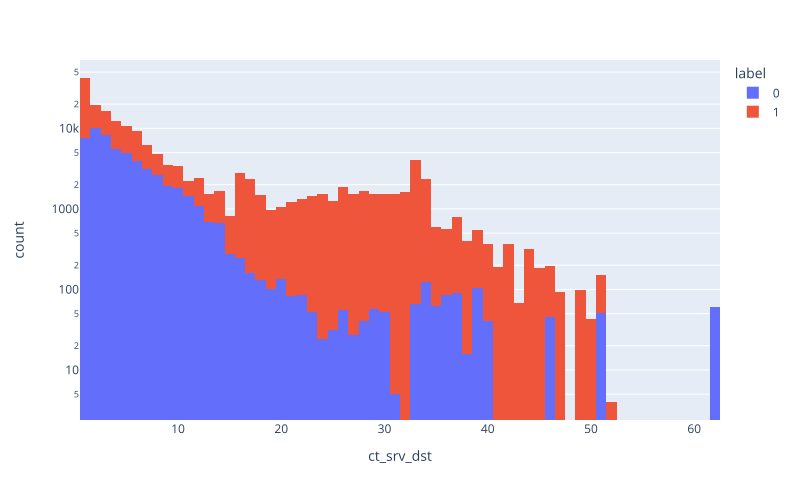

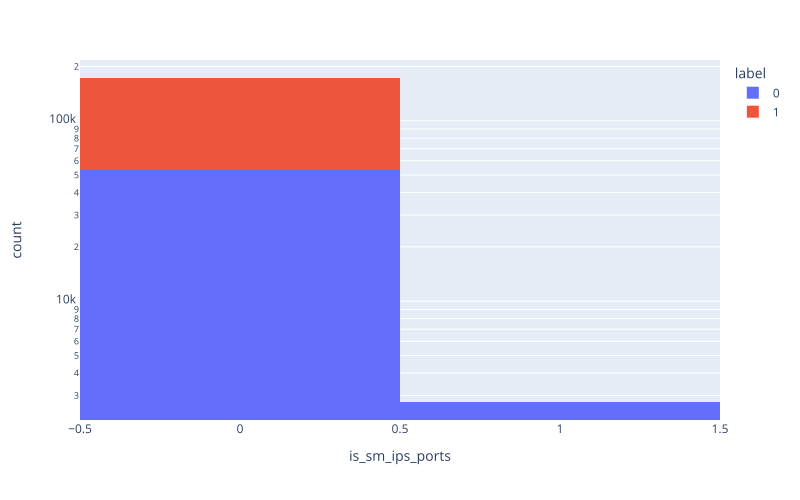

In [24]:
numeric_cols = train.select_dtypes(exclude='object').columns
for feature in numeric_cols:
    if feature != 'id' and feature != 'label':
        fig = px.histogram(train, x=feature, log_y=True, color="label")
        fig.show(renderer="svg", width=800, height=500)

In general, attacks have higher distributions w.r.t. non-attack ones. 

# 2. Data cleaning

The data cleaning phase is applied both to the training and the test set. It is an important phase because data quality has an high impact on the precision and the accuracy of the machine learning models. It is important to manage both the sets in the same manner to gurantee that the models will be evaluated equally and in a reliable manner. 


Data in real word is dirty. The may be:
- incomplete (missing values)
- noisy (containing noise, errors, outliers)
- inconsitent (containing dicrepancies)
- intentional 

Some utility variables for different feature types:

In [25]:
# retrieve features based on their types
col_names = np.array(df_total.columns)
nominal_idx = [2, 3, 4] # indexes of nominal features
binary_idx =  [37, 42] # indexes of binary features
target_idx = [43, 44, 45] # attack category, label and utility column for splitting
numeric_idx = list(set(range(43)).difference(nominal_idx).difference(binary_idx).difference(target_idx)) # indexes of numerical features


nominal_cols = col_names[nominal_idx].tolist()
binary_cols = col_names[binary_idx].tolist()
target_cols = col_names[target_idx].tolist()
numeric_cols = col_names[numeric_idx].tolist()

In [26]:
print("Check on columns assignment:\n")
print(f"nominal_cols = {nominal_cols}\n")
print(f"binary_cols  = {binary_cols}\n")
print(f"target_cols  = {target_cols}\n")
print(f"numeric_cols = {numeric_cols}\n")

Check on columns assignment:

nominal_cols = ['proto', 'service', 'state']

binary_cols  = ['is_ftp_login', 'is_sm_ips_ports']

target_cols  = ['attack_cat', 'label', 'type']

numeric_cols = ['id', 'dur', 'spkts', 'dpkts', 'sbytes', 'dbytes', 'rate', 'sttl', 'dttl', 'sload', 'dload', 'sloss', 'dloss', 'sinpkt', 'dinpkt', 'sjit', 'djit', 'swin', 'stcpb', 'dtcpb', 'dwin', 'tcprtt', 'synack', 'ackdat', 'smean', 'dmean', 'trans_depth', 'response_body_len', 'ct_srv_src', 'ct_state_ttl', 'ct_dst_ltm', 'ct_src_dport_ltm', 'ct_dst_sport_ltm', 'ct_dst_src_ltm', 'ct_ftp_cmd', 'ct_flw_http_mthd', 'ct_src_ltm', 'ct_srv_dst']



## 2.1 Drop useless columns
Remove useless *id* column:

In [27]:
df_total.drop(['id'], axis=1, inplace=True)

## 2.2 Missing values check

In [28]:
df_total.isnull().values.any()

False

## 2.3 Consistency checking

Let's take a look at the *binary* features (index and column transposition is used). By definition, all of these features should have a min of *0.0* and a max of *1.0*:

In [29]:
df_total[binary_cols].describe().transpose()

,count,mean,std,min,25%,50%,75%,max
is_ftp_login,257673.0,0.012819,0.116091,0.0,0.0,0.0,0.0,4.0
is_sm_ips_ports,257673.0,0.014274,0.118618,0.0,0.0,0.0,0.0,1.0


The `is_ftp_login` has a maximum value of 4

In [30]:
df_total.groupby(['is_ftp_login']).size()

is_ftp_login
0    254428
1      3219
2        10
4        16
dtype: int64

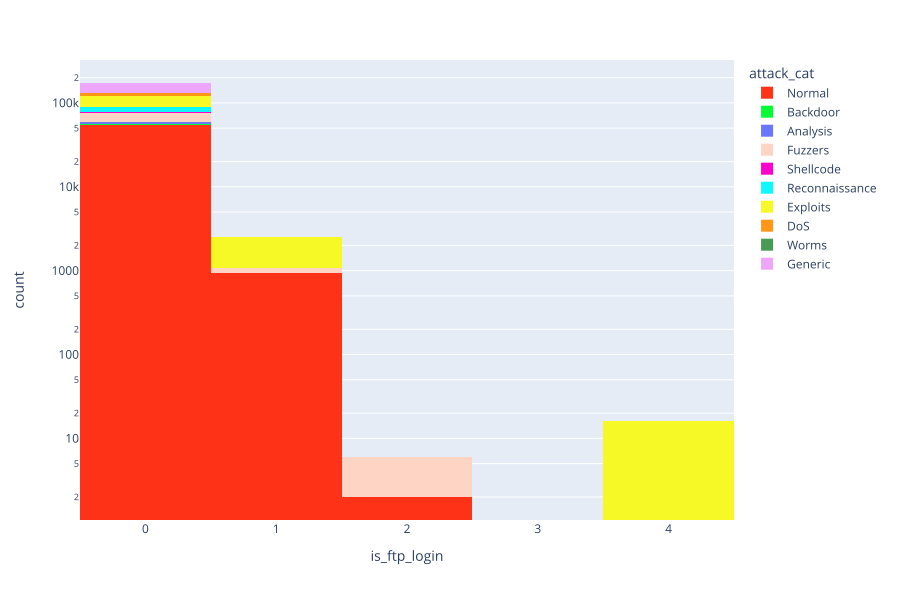

In [31]:
fig = px.histogram(train, x='is_ftp_login', log_y=True, color="attack_cat", color_discrete_sequence=px.colors.qualitative.Light24)
fig.update_layout(xaxis={'categoryorder':'total ascending'})
fig.show(renderer="svg", width=900, height=600)

We restore a logical value, this can also be inferred with some more precise method as we've studied in the theory. 

In [32]:
# Let's fix this discrepancy, from the picture above we can assume:
# is_ftp_login == 2 ==> 0 
# is_ftp_login == 4 ==> 1
df_total['is_ftp_login'].replace(2, 0, inplace=True)
df_total['is_ftp_login'].replace(4, 1, inplace=True)
df_total.groupby(['is_ftp_login']).size()

is_ftp_login
0    254438
1      3235
dtype: int64

## 2.4 Checking for single-value features

In [33]:
df_total.nunique()

dur                  109945
proto                   133
service                  13
state                    11
spkts                   646
dpkts                   627
sbytes                 9382
dbytes                 8653
rate                 115411
sttl                     13
dttl                      9
sload                121356
dload                116380
sloss                   490
dloss                   476
sinpkt               114102
dinpkt               110132
sjit                 116800
djit                 114673
swin                     22
stcpb                114473
dtcpb                114187
dwin                     19
tcprtt                63878
synack                57366
ackdat                53248
smean                  1377
dmean                  1362
trans_depth              14
response_body_len      2819
ct_srv_src               57
ct_state_ttl              7
ct_dst_ltm               52
ct_src_dport_ltm         52
ct_dst_sport_ltm         35
ct_dst_src_ltm      

## 2.5 Duplicates check

In [34]:
train.duplicated().sum()

0

In [35]:
test.duplicated().sum()

0

## 2.5 Smoothing, Clamping and Log Transform

In [36]:
df_numeric = df_total.select_dtypes(include=[np.number])
for feature in df_numeric:
    if df_numeric[feature].max()>10*df_numeric[feature].median() and df_numeric[feature].max()>10 :
        df_total[feature] = np.where(df_total[feature] < df_total[feature].quantile(0.95), df_total[feature], df_total[feature].quantile(0.95))

In [37]:
df_numeric = df_total.select_dtypes(include=[np.number])
for feature in df_numeric.columns:
    if df_numeric[feature].nunique() > 50:
        if df_numeric[feature].min() == 0:
            df_total[feature] = np.log(df_total[feature] + 1)
        else:
            df_total[feature] = np.log(df_total[feature])

## 2.6 Balance checking

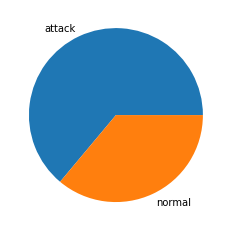

In [40]:
# binary classifiacation problem --> balanced
wedges = df_total['label'].value_counts()
plt.pie(np.array(wedges), labels= ['attack', 'normal'])
plt.show()

### 2.7 Correlation Analysis Insight


Correlation analysis it is most commonly performed on the training data. The purpose of performing correlation analysis on the training data is to identify the relationships between the independent variables (predictors) and the dependent variable (outcome). This information can then be used to inform the selection of predictors for a predictive model or to inform feature engineering efforts. 

<AxesSubplot:>

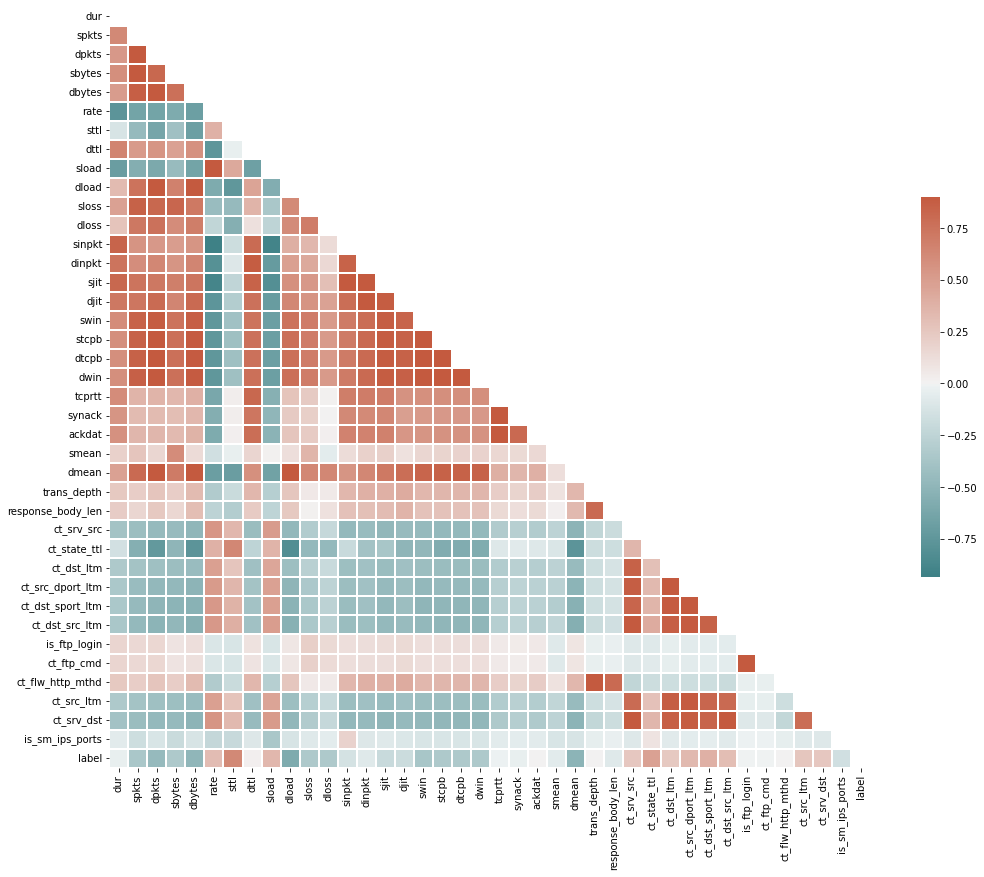

In [41]:
correlations = df_total.corr(method='pearson') # Pearson is needed for numerical data

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(correlations, dtype=bool))
fig, ax = plt.subplots(figsize=(18,14))
# Generate a custom diverging colormap
cmap = sns.diverging_palette(200, 20, as_cmap=True)
sns.heatmap(correlations, mask=mask, cmap=cmap, vmax=.9, center=0,
            square=True, linewidths=.1, cbar_kws={"shrink": .5})


In [42]:
def top_correlations(correlations, limit=0.95):
    columns = correlations.columns
    for i in range(correlations.shape[0]):
        for j in range(i+1, correlations.shape[0]):
            if correlations.iloc[i,j] >= limit or correlations.iloc[i,j] <= -limit:
                print(f"{columns[i]} <-> {columns[j]}  ==  {correlations.iloc[i,j]*100}")

top_correlations(correlations)

# Pearson
    # limit == 0.9
        # spkts <-> sbytes  ==  96.4393217155871
        # spkts <-> sloss  ==  97.18594116510776
        # dpkts <-> dbytes  ==  97.34453279792797
        # dpkts <-> dloss  ==  97.9612084935938
        # sbytes <-> sloss==  99.57715772406667
        # dbytes <-> dloss  ==  99.67111338314551
        # sinpkt <-> is_sm_ips_ports  ==  94.21206233324895
        # swin <-> dwin  ==  98.04584289136497
        # tcprtt <-> synack  ==  94.30527537645945
        # tcprtt <-> ackdat  ==  92.02175912501836
        # ct_srv_src <-> ct_dst_src_ltm  ==  95.39519771685964
        # ct_srv_src <-> ct_srv_dst  ==  97.94668130725528
        # ct_dst_ltm <-> ct_src_dport_ltm  ==  96.15176986568883
        # ct_dst_ltm <-> ct_src_ltm  ==  90.15817705704372
        # ct_src_dport_ltm <-> ct_dst_sport_ltm  ==  90.83371617418115
        # ct_src_dport_ltm <-> ct_src_ltm  ==  90.94302805367734
        # ct_dst_src_ltm <-> ct_srv_dst  ==  96.03212131064117
        # is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241
    # limit == 0.95
        # dpkts <-> dbytes  ==  97.76737002221728
        # dbytes <-> dload  ==  95.09783492996641
        # dbytes <-> dmean  ==  98.76156469268844
        # rate <-> sload  ==  97.30769401765275
        # dload <-> dmean  ==  96.52106425259068
        # swin <-> stcpb  ==  97.87232735525889
        # swin <-> dtcpb  ==  97.85822124027848
        # swin <-> dwin  ==  98.04584289136497
        # stcpb <-> dtcpb  ==  99.61466213840428
        # stcpb <-> dwin  ==  99.76286485467159
        # dtcpb <-> dwin  ==  99.77706791818485
        # tcprtt <-> synack  ==  95.35300491978894
        # trans_depth <-> ct_flw_http_mthd  ==  99.99563577287881
        # ct_srv_src <-> ct_srv_dst  ==  97.68827900096507
        # ct_dst_ltm <-> ct_src_dport_ltm  ==  95.02007614056207
        # ct_dst_src_ltm <-> ct_srv_dst  ==  95.654660229205
        # is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241


# Spearman
    # limit == 0.95
        # dpkts <-> dbytes  ==  98.93849110465906
        # dpkts <-> dloss  ==  95.74133924170964
        # dbytes <-> dmean  ==  96.08103833674461
        # rate <-> sload  ==  95.99403389658015
        # rate <-> sinpkt  ==  -95.4574113650721
        # dttl <-> dinpkt  ==  95.35437059073675
        # dload <-> dmean  ==  96.33512066355334
        # swin <-> dwin  ==  98.0517974684704
        # tcprtt <-> synack  ==  99.62674088699754
        # tcprtt <-> ackdat  ==  99.26582235754053
        # synack <-> ackdat  ==  98.17222928560732
        # trans_depth <-> ct_flw_http_mthd  ==  99.99563577287857
        # is_ftp_login <-> ct_ftp_cmd  ==  99.80873924214644

dpkts <-> dbytes  ==  97.76737002221728
dbytes <-> dload  ==  95.09783492996641
dbytes <-> dmean  ==  98.76156469268844
rate <-> sload  ==  97.30769401765275
dload <-> dmean  ==  96.52106425259068
swin <-> stcpb  ==  97.87232735525889
swin <-> dtcpb  ==  97.85822124027848
swin <-> dwin  ==  98.04584289136497
stcpb <-> dtcpb  ==  99.61466213840428
stcpb <-> dwin  ==  99.76286485467159
dtcpb <-> dwin  ==  99.77706791818485
tcprtt <-> synack  ==  95.35300491978894
trans_depth <-> ct_flw_http_mthd  ==  99.99563577287881
ct_srv_src <-> ct_srv_dst  ==  97.68827900096507
ct_dst_ltm <-> ct_src_dport_ltm  ==  95.02007614056207
ct_dst_src_ltm <-> ct_srv_dst  ==  95.654660229205
is_ftp_login <-> ct_ftp_cmd  ==  97.22566457858241


Most correlated (and shared between the two results) features are:

* spkts, sloss
* dpkts, dbytes, dloss
* swin, dwin
* tcprtt, synack
* tcprtt, ackdat
* is_ftp_login, ct_ftp_cmd

We can easily visualize correlations in a scatter plot. In the cell below a strong positive correlations between the *dbytes* and the *dloss* features is shown. Other examples are provided below, but here the analysis is not exhaustive. 

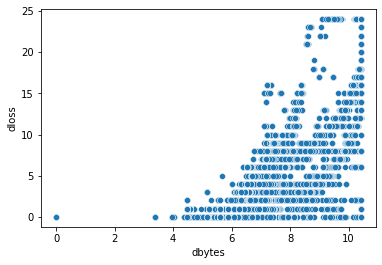

In [43]:
sns.scatterplot(x = 'dbytes', y = 'dloss', data = df_total); 

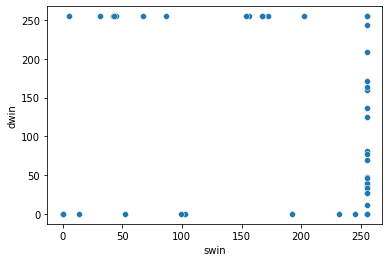

In [44]:
sns.scatterplot(x = 'swin', y = 'dwin', data = df_total);

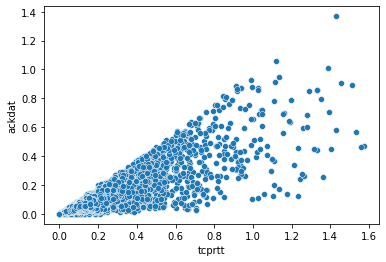

In [45]:
sns.scatterplot(x = 'tcprtt', y = 'ackdat', data = df_total);

# 3. Data Selection & Data Preparation

This is an important step in the machine learning process, we have to select a significant data subset then used to learn a model. Data selection is performed to raise the quality of machine learning models and to improve the performance of the models with new data. This could include missing or duplicate data removing, the deletion of useless features or the selection of a subset of the most important features. This step can also include the modification of the data distribution to make the model stable if the dataset is unbalanced.  

The data selection step can contain oversampling and undersampling methods (this will be done only in the multiclass chapter because it is not necessary for the binary problem). 

Oversampling consists in increasing the data quantity of a minority class within the dataset to guarantee a higher representability of that class. This step can be useful to prevent understimating machine learning model performance. 

Undersampling consists in the reduction of data quantità of a majority class within the dataset to stabilize the representation of different classes. This step can be useuful to prevent overstimating machine learning model performance.


The pre-elaboration phase is fundamental and should be executed both on the train and the test set. This phase consists in a serie of steps, like data cleaning (already performed), normalization, feature transformation and selection, that aim at improve the quality and the usability of the data to perform an automatic learning. 
It's important that both the train and the test set will be treated in the same manner, to avoid models either to be disadvantaged or to introduce inconsistencies. For example, if normalization is performed only on the train set, but not on the test set, test set values could not be represented correcly and negatively affect the model evaluation. 


# 3.1 Data Preparation

In [46]:
def create_count_df(col, data=df_total):
    df = pd.DataFrame(data[col].value_counts().reset_index().values, columns = [col, 'count'])
    df['percent'] = df['count'].values*100/data.shape[0]
    return df.sort_values(by='percent', ascending=False)

def corr(col1, col2='label', df=df_total):
    return pd.concat([df[col1], df[col2]], axis=1).corr().iloc[0,1]

### State

In [47]:
col = 'state'
# create_count_df(col, train) # to set the row below
df_total.loc[~df_total[col].isin(['FIN', 'INT', 'CON', 'REQ', 'RST']), col] = 'others'
create_count_df(col)

,state,count,percent
0,FIN,117164,45.470034
1,INT,116438,45.188281
2,CON,20134,7.813779
3,REQ,3833,1.487544
4,RST,84,0.032599
5,others,20,0.007762


### is_sm_ips_ports

C:\Users\Francesco\anaconda3\lib\site-packages\seaborn\axisgrid.py:156: UserWarning:

You have mixed positional and keyword arguments, some input may be discarded.



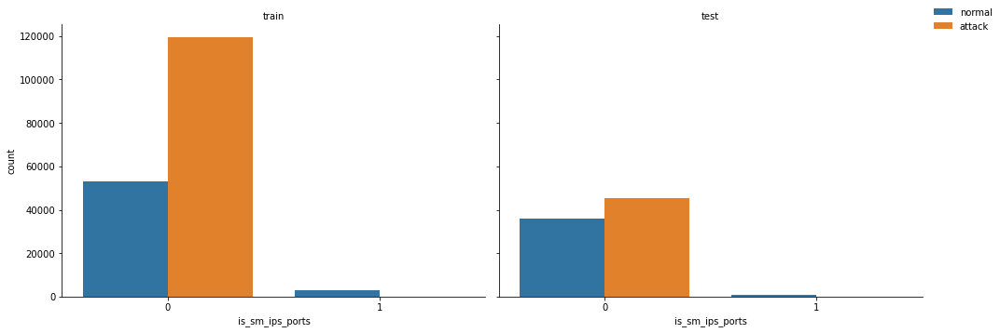

In [48]:
# is_sm_ips_ports, if it is 1 the connection is always normal
ax = sns.catplot(x='is_sm_ips_ports', hue="label", col="type", data=df_total, kind="count", height=5, legend=False, aspect=1.4)
ax.set_titles("{col_name}")
ax.add_legend(loc='upper right', labels=['normal','attack'])
plt.show(ax)

## 3.2 Feature Selection

Now the problem of dimensionality reduction is assessed. In particular it could be needed for:
- avoid the curse of dimensionality
- help in eliminating irrelevant features and reduce noise
- reduce time and space required
- allow easier visualization

This step is not always performed.

### Correlation based selection
First, we can drop the correlated features (see Correlatioin Analysis):

In [49]:
df_total.drop('sloss', axis=1, inplace=True)
df_total.drop('dbytes', axis=1, inplace=True)
df_total.drop('dwin', axis=1, inplace=True)
df_total.drop('synack', axis=1, inplace=True)
df_total.drop('ackdat', axis=1, inplace=True)
df_total.drop('is_ftp_login', axis=1, inplace=True)

### One-Hot Encoding

In [50]:
# Remove the first level of the categorical attribute, to avoid the so-called "dummy variable trap"
df_total_new = pd.get_dummies(df_total, columns=nominal_cols, drop_first=True) # one-hot encoding
dummy_variables = list(set(df_total_new) - set(df_total))
df_total = df_total_new
dummy_variables

# train_x = combined_df[combined_df['type'] == 'train']
# test_x = combined_df[combined_df['type'] == 'test']
# df_total.drop(['type'], axis=1, inplace=True)
# combined_df.drop(['type'], axis=1, inplace=True)
# train_x.drop(['type'], axis=1, inplace=True)
# test_x.drop(['type'], axis=1, inplace=True)

['proto_nvp',
 'proto_trunk-1',
 'proto_irtp',
 'state_FIN',
 'proto_leaf-2',
 'proto_rtp',
 'proto_secure-vmtp',
 'proto_argus',
 'proto_ib',
 'service_http',
 'proto_wsn',
 'proto_ipcv',
 'proto_visa',
 'proto_vmtp',
 'proto_egp',
 'proto_idpr-cmtp',
 'proto_ipip',
 'service_pop3',
 'proto_st2',
 'proto_ipnip',
 'proto_idpr',
 'proto_stp',
 'proto_hmp',
 'proto_crudp',
 'proto_encap',
 'proto_unas',
 'proto_cphb',
 'proto_rvd',
 'proto_sctp',
 'proto_ax.25',
 'proto_icmp',
 'proto_ptp',
 'proto_tcp',
 'proto_etherip',
 'proto_chaos',
 'proto_rsvp',
 'proto_smp',
 'proto_vines',
 'proto_sat-mon',
 'proto_isis',
 'proto_mtp',
 'proto_ipv6-frag',
 'proto_swipe',
 'proto_idrp',
 'proto_rdp',
 'proto_xtp',
 'proto_compaq-peer',
 'service_ssl',
 'proto_ddp',
 'proto_sep',
 'service_radius',
 'proto_scps',
 'proto_emcon',
 'proto_trunk-2',
 'proto_sps',
 'proto_ipx-n-ip',
 'proto_ddx',
 'proto_mobile',
 'state_others',
 'service_dhcp',
 'proto_larp',
 'service_irc',
 'proto_qnx',
 'proto_bb

In [51]:
df_total.shape

(257673, 185)

### Numerosity Reduction and Splitting

In [52]:
# retrieve original datasets 
train = df_total[df_total['type'] == 'train']
train_len = len(train)
test = df_total[df_total['type'] == 'test']
test_len = len(test)

train = train.sample(n=85000, replace=True, random_state=0, ignore_index=True)
test = test.sample(n=40000, replace=True, random_state=0, ignore_index=True)

# splitting the train set
train_y_multi = train['attack_cat'] 
train_y_bin = train['label']
train_x_raw = train.drop(['attack_cat', 'label', 'type'], axis=1) 

# splitting the test set
test_y_multi = test['attack_cat']
test_y_bin = test['label']
test_x_raw = test.drop(['attack_cat', 'label', 'type'], axis=1)

### Label Encoding

In [53]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
le.fit(['Normal', 'Fuzzers', 'Shellcode', 'DoS', 'Backdoor', 'Analysis', 'Generic', 'Reconnaissance', 'Exploits', 'Worms'])
# list(le.classes_)
train_y_multi = pd.Series(le.transform(train_y_multi))
test_y_multi = pd.Series(le.transform(test_y_multi))

In [54]:
# combined train and test set, without the ground truth
combined_df_raw = pd.concat([train_x_raw, test_x_raw])
combined_df_raw_y_bin = pd.concat([train_y_bin, test_y_bin])
combined_df_raw_y_multi = pd.concat([train_y_multi, test_y_multi])

### Feature Selection Analysis

In [55]:
# Feature selection: Chi2

best_features = SelectKBest(score_func=chi2, k='all')

fit_bin = best_features.fit(train_x_raw, train_y_bin)
df_scores_bin = pd.DataFrame(fit_bin.scores_)
df_cols = pd.DataFrame(train_x_raw.columns)
feature_score_bin = pd.concat([df_cols, df_scores_bin], axis=1)
feature_score_bin.columns=['feature','score']
feature_score_bin.sort_values(by=['score'], ascending=False, inplace=True)
print(feature_score_bin)


# Scores: 

#               feature         score
# 17              stcpb  2.160697e+13
# 18              dtcpb  2.079258e+13
# 8               sload  2.832137e+12
# 9               dload  2.374350e+11
# 5                rate  5.743264e+09
# 4              dbytes  1.432230e+09
# 12             sinpkt  2.892880e+08
# 3              sbytes  2.089252e+08
# 26  response_body_len  1.096430e+08
# 15               djit  1.772847e+07
# 24              dmean  1.100826e+07
# 6                sttl  4.966079e+06
# 14               sjit  3.560351e+06
# 16               swin  2.707785e+06
# 19               dwin  2.507527e+06
# 2               dpkts  1.580336e+06
# 13             dinpkt  1.014482e+06
# 11              dloss  6.291405e+05
# 1               spkts  4.406746e+05
# 7                dttl  2.429885e+05
# 32     ct_dst_src_ltm  2.225998e+05
# 30   ct_src_dport_ltm  1.969422e+05
# 31   ct_dst_sport_ltm  1.779242e+05
# 37         ct_srv_dst  1.159385e+05
# 27         ct_srv_src  1.132542e+05
# 36         ct_src_ltm  9.906313e+04
# 29         ct_dst_ltm  9.700700e+04
# 28       ct_state_ttl  4.087154e+04
# 0                 dur  7.088066e+03
# 23              smean  6.262384e+03
# 38    is_sm_ips_ports  5.886069e+03
# 20             tcprtt  1.775311e+02
# 35   ct_flw_http_mthd  1.617428e+02
# 22             ackdat  1.338511e+02
# 25        trans_depth  1.164972e+02
# 10              sloss  6.319460e+01
# 21             synack  5.339926e+01
# 33       is_ftp_login  2.992649e+01
# 34         ct_ftp_cmd  2.277480e+01

            feature         score
5              sttl  2.402982e+06
14             swin  1.288878e+06
8             dload  1.907286e+05
9             dloss  1.597833e+05
6              dttl  1.202670e+05
..              ...           ...
181    state_others  6.367768e+00
173    service_smtp  3.557374e+00
170     service_irc  3.297859e+00
123       proto_rtp  2.122589e+00
172  service_radius  9.422455e-01

[182 rows x 2 columns]


In [56]:
# Feature selection: Random Forest
importance_dict = {
    'feature': train_x_raw.columns
}

# on train data only, bin
clf_1 = RandomForestClassifier(random_state=1, n_jobs=-1)
clf_1.fit(train_x_raw, train_y_bin)
feature_importance_1 = clf_1.feature_importances_
importance_dict['train_bin'] = feature_importance_1

# on train data only, multi
clf_2 = RandomForestClassifier(random_state=1, n_jobs=-1)
clf_2.fit(train_x_raw, train_y_multi)
feature_importance_2 = clf_2.feature_importances_
importance_dict['train_multi'] = feature_importance_2

In [57]:
# ten-fold cross validation on train data, bin
from tqdm import notebook

feature_importances_bin = []
skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

for tr_idx, val_idx in notebook.tqdm(skf.split(train_x_raw, train_y_bin), total=10):
    x_train, y_train = train_x_raw.iloc[tr_idx], train_y_bin[tr_idx]
    clf_bin = RandomForestClassifier(n_jobs=-1)
    clf_bin.fit(x_train, y_train)
    
    feature_importances_bin.append(clf_bin.feature_importances_)
    
feature_importance_bin = np.mean(feature_importances_bin, axis=0)
importance_dict['train_10_fold_bin'] = feature_importance_bin

importance_df = pd.DataFrame(importance_dict)
for col in importance_df.columns:
    if col == 'feature':
        continue
    importance_df[col] = importance_df[col] * 100 / importance_df[col].sum()
    
# importance_df['mean'] = importance_df[[col for col in importance_df.columns if col != 'feature']].mean(axis=1)
# importance_df.sort_values('train_10_fold_bin', ascending=False)

  0%|          | 0/10 [00:00<?, ?it/s]

In [58]:
# ten-fold cross validation on train data, multi-class
# feature_importances_multi = []
# skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)

# for tr_idx, val_idx in notebook.tqdm(skf.split(train_x_raw, train_y_multi), total=10):
#     x_train, y_train = train_x_raw.iloc[tr_idx], train_y_multi[tr_idx]
#     clf_multi = RandomForestClassifier(n_jobs=-1)
#     clf_multi.fit(x_train, y_train)
    
#     feature_importances_multi.append(clf_multi.feature_importances_)
    
# feature_importance_multi = np.mean(feature_importances_multi, axis=0)
# importance_dict['train_10_fold_multi'] = feature_importance_multi

# importance_df = pd.DataFrame(importance_dict)
# for col in importance_df.columns:
#     if col == 'feature':
#         continue
#     importance_df[col] = importance_df[col] * 100 / importance_df[col].sum()
    
# importance_df['mean'] = importance_df[[col for col in importance_df.columns if col != 'feature']].mean(axis=1)
# importance_df.sort_values('train_10_fold_multi', ascending=False)

  0%|          | 0/10 [00:00<?, ?it/s]

,feature,train_bin,train_multi,train_10_fold_bin,train_10_fold_multi,mean
3,sbytes,3.552020,7.329679,3.554555,7.237906,5.418540
31,ct_srv_dst,3.675137,6.891557,3.150277,5.937036,4.913502
5,sttl,9.555758,6.276070,12.228744,5.850328,8.477725
18,smean,3.051539,5.296152,2.825900,5.261388,4.108745
22,ct_srv_src,2.355446,4.458530,2.469788,4.831822,3.528897
...,...,...,...,...,...,...
172,service_radius,0.000088,0.001922,0.000154,0.002072,0.001059
140,proto_st2,0.002719,0.002246,0.001637,0.001561,0.002041
181,state_others,0.002595,0.001020,0.002367,0.000785,0.001692
69,proto_icmp,0.003395,0.000660,0.002001,0.000741,0.001699


In [59]:
importance_df = importance_df.sort_values('mean', ascending=False)

In [60]:
importance_df

,feature,train_bin,train_multi,train_10_fold_bin,train_10_fold_multi,mean
5,sttl,9.555758,6.276070,12.228744,5.850328,8.477725
23,ct_state_ttl,10.631411,4.256584,9.119246,4.087273,7.023628
3,sbytes,3.552020,7.329679,3.554555,7.237906,5.418540
31,ct_srv_dst,3.675137,6.891557,3.150277,5.937036,4.913502
4,rate,7.106869,3.207920,5.011610,3.484778,4.702794
...,...,...,...,...,...,...
62,proto_ggp,0.000003,0.003276,0.000021,0.003871,0.001793
69,proto_icmp,0.003395,0.000660,0.002001,0.000741,0.001699
181,state_others,0.002595,0.001020,0.002367,0.000785,0.001692
172,service_radius,0.000088,0.001922,0.000154,0.002072,0.001059


The results are pretty different, I decided to maintain both of them and analyse the results. 

In [61]:
irrelevant_features_chi2 = list(feature_score_bin['feature'].iloc[30:])
irrelevant_features_rf = list(importance_df['feature'].iloc[30:])
irrelevant_features = list(set(irrelevant_features_rf).union(set(irrelevant_features_chi2)))
irrelevant_features

['smean',
 'proto_nvp',
 'proto_trunk-1',
 'proto_irtp',
 'state_FIN',
 'response_body_len',
 'proto_leaf-2',
 'proto_rtp',
 'proto_secure-vmtp',
 'service_http',
 'proto_argus',
 'proto_ib',
 'proto_wsn',
 'proto_visa',
 'proto_ipcv',
 'proto_vmtp',
 'tcprtt',
 'proto_idpr-cmtp',
 'proto_egp',
 'proto_ipip',
 'service_pop3',
 'proto_st2',
 'proto_ipnip',
 'proto_idpr',
 'proto_stp',
 'proto_hmp',
 'proto_crudp',
 'proto_encap',
 'proto_unas',
 'proto_cphb',
 'proto_sctp',
 'proto_rvd',
 'proto_ax.25',
 'proto_ptp',
 'proto_icmp',
 'proto_tcp',
 'proto_etherip',
 'proto_chaos',
 'proto_rsvp',
 'proto_smp',
 'proto_vines',
 'proto_sat-mon',
 'proto_mtp',
 'proto_isis',
 'proto_swipe',
 'proto_ipv6-frag',
 'proto_idrp',
 'proto_xtp',
 'service_ssl',
 'proto_compaq-peer',
 'proto_rdp',
 'dinpkt',
 'proto_ddp',
 'proto_sep',
 'service_radius',
 'proto_scps',
 'ct_ftp_cmd',
 'proto_emcon',
 'proto_trunk-2',
 'proto_sps',
 'proto_ipx-n-ip',
 'proto_ddx',
 'ct_flw_http_mthd',
 'proto_mobile',

In [62]:
train_reduced = train_x_raw.drop(labels=irrelevant_features, axis=1)
test_reduced = test_x_raw.drop(labels=irrelevant_features, axis=1)
train_reduced.shape

(85000, 24)

An important note is that we cannot just select the best features, they may contain the same information, it would be better to implement an heuristic approach. In the followin I simply decided to remove from the selected subset of best features the most correleted ones. 

In [63]:
correlations_reduced = train_reduced.corr(method='pearson') # Pearson is needed for numerical data
top_correlations(correlations_reduced)

rate <-> sload  ==  97.26444887237412
dload <-> dmean  ==  96.568000517313
stcpb <-> dtcpb  ==  99.62538761109137
ct_srv_src <-> ct_dst_src_ltm  ==  96.6588291444802
ct_srv_src <-> ct_srv_dst  ==  97.94474336742273
ct_dst_ltm <-> ct_src_dport_ltm  ==  95.27340882047028
ct_dst_src_ltm <-> ct_srv_dst  ==  97.15323413610867


In [64]:
selected_but_correlated = ['rate', 'dmean', 'dtcpb', 'ct_dst_src_ltm', 'ct_srv_dst', 'ct_src_dport_ltm']
train_reduced = train_reduced.drop(labels=selected_but_correlated, axis=1)
test_reduced = test_reduced.drop(labels=selected_but_correlated, axis=1)
train_reduced.shape

(85000, 18)

------------------------------------

## 3.3 Normalization
**Observation**: 
The distributions of each feature vary widely, this will affect our results if we use any distance-based methods for classification. 
For instance, the mean of `sload` is larger than the mean of `dur` by seven orders of magnitude, and its standard deviation is larger by eight orders of magnitude.

Without performing feature value normalization, the `sload` feature would dominate, causing the model to miss out on potentially important information in the `dur` feature. We need to rescale the value. 

This step is usually applied to both the training and test data. The purpose of standardization is to transform the data so that it has a mean of zero and a standard deviation of one. This is done so that the data has a common scale, which is important for many machine learning algorithms that use distance metrics or assume a Gaussian distribution of the input features. By standardizing both the training and test data using the same statistics (mean and standard deviation) computed from the training data, we ensure that the test data is transformed in the same way as the training data and the results are comparable.

In [65]:
train_reduced.describe()

,spkts,dpkts,sbytes,sttl,dttl,sload,dload,dloss,sjit,djit,stcpb,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_dst_sport_ltm,ct_src_ltm,service_dns,state_INT
count,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000
mean,1.748543,1.358263,6.225071,179.464541,80.234859,13.855430,5.598919,3.048000,3.463562,2.222960,9.601979,9.124424,1.301141,5.833765,4.139906,6.576624,0.269224,0.466624
std,1.215177,1.453455,1.483497,102.974341,110.769220,4.617495,5.715635,6.176089,3.827520,2.722590,10.559977,10.206304,0.953789,6.930953,5.586801,7.184818,0.443559,0.498888
min,0.000000,0.000000,3.828641,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,0.693147,0.000000,4.736198,62.000000,0.000000,9.452843,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,1.000000,1.000000,1.000000,2.000000,0.000000,0.000000
50%,1.386294,1.098612,6.186209,254.000000,29.000000,13.629922,7.359644,0.000000,0.000000,0.000000,0.000000,5.000000,1.000000,2.000000,1.000000,3.000000,0.000000,0.000000
75%,2.484907,2.397895,7.262629,254.000000,252.000000,18.302898,10.258187,2.000000,7.847232,4.767674,21.370009,12.000000,2.000000,7.000000,3.000000,9.000000,1.000000,1.000000
max,4.127134,4.143135,9.507032,255.000000,252.000000,19.401510,15.193128,24.000000,9.162146,7.929434,22.067684,34.000000,6.000000,25.000000,17.000000,25.000000,1.000000,1.000000


The chosen scaler is RobustScaler because of its capability of maintaining small differences in the distributions, especially for outliers. In terms of classification accuracy the transformations below are quite similar, thus StandardScaled was picked. 

In [66]:
# from sklearn.preprocessing import StandardScaler
# numeric_cols = train_reduced.select_dtypes(exclude='object').columns
# ss = StandardScaler()
# train_reduced[numeric_cols] = ss.fit_transform(train_reduced[numeric_cols])
# test_reduced[numeric_cols] = ss.transform(test_reduced[numeric_cols])

In [67]:
# from sklearn.preprocessing import RobustScaler
# numeric_cols = train_reduced.select_dtypes(exclude='object').columns
# rs = RobustScaler().fit(train_reduced[numeric_cols]);
# train_reduced[numeric_cols] = rs.transform(train_reduced[numeric_cols]);
# test_reduced[numeric_cols] = rs.transform(test_reduced[numeric_cols]);

In [68]:
from sklearn.preprocessing import MinMaxScaler
numeric_cols = train_reduced.select_dtypes(exclude='object').columns
mms = MinMaxScaler()
train_reduced[numeric_cols] = mms.fit_transform(train_reduced[numeric_cols])
test_reduced[numeric_cols] = mms.transform(test_reduced[numeric_cols])

In [69]:
train_reduced.describe()

,spkts,dpkts,sbytes,sttl,dttl,sload,dload,dloss,sjit,djit,stcpb,ct_srv_src,ct_state_ttl,ct_dst_ltm,ct_dst_sport_ltm,ct_src_ltm,service_dns,state_INT
count,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000,85000.000000
mean,0.423670,0.327835,0.422026,0.703783,0.318392,0.714163,0.368530,0.127000,0.378042,0.280356,0.435115,0.246195,0.216857,0.201407,0.196244,0.232359,0.269224,0.466624
std,0.294436,0.350811,0.261253,0.403821,0.439560,0.238001,0.376233,0.257337,0.417720,0.343389,0.478527,0.309282,0.158965,0.288790,0.349175,0.299367,0.443559,0.498888
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.167949,0.000000,0.159826,0.243137,0.000000,0.487222,0.000000,0.000000,0.000000,0.000000,0.000000,0.030303,0.166667,0.000000,0.000000,0.041667,0.000000,0.000000
50%,0.335898,0.265165,0.415182,0.996078,0.115079,0.702519,0.484406,0.000000,0.000000,0.000000,0.000000,0.121212,0.166667,0.041667,0.000000,0.083333,0.000000,0.000000
75%,0.602090,0.578764,0.604747,0.996078,1.000000,0.943375,0.675186,0.083333,0.856484,0.601263,0.968385,0.333333,0.333333,0.250000,0.125000,0.333333,1.000000,1.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [70]:
train_x = train_reduced
test_x = test_reduced

They all produce very similar results. 

# 4. Data Modelling (Classification)

**Why classification and not anomaly detection?**

Classification and anomaly detection are two different machine learning tasks.

**Classification** involves assigning a predefined class or category to a new instance based on its features. For example, classify a new email as spam or not spam.

**Anomaly detection**, on the other hand, involves detecting instances that are different from the norm in the data. For example, detecting fraudulent transactions in a set of financial transactions.

In summary, classification divides data into predefined categories, while anomaly detection identifies instances that are outside of the norm.

## 4.1 Supervised Learning

### Decision Tree

#### Binary classification

In [ ]:
# Visualization purposes
# We start with a small max_depth so we can look at the decision tree structure in a friendly way
classifier = DecisionTreeClassifier(max_depth=7)
classifier = classifier.fit(train_x, train_y_bin)
print(f"double check shapes: X.shape = {train_x.shape}, y.shape = {train_y_bin.shape}")
print(f"model classes: {classifier.classes_}")

In [ ]:
from sklearn import tree
plt.figure(figsize=(30, 20), dpi=150)
tree.plot_tree(classifier, feature_names = train_x.columns, fontsize=14)
plt.show()

In [44]:
# various combinations of the parameters were tried, in particular max_depth=8 is optimal
# for example, max_depth= 10 with '30' features gives the same result, but worst performance
# random_state is set to an integer to obtain a deterministic behaviour in fitting
classifier = DecisionTreeClassifier(criterion='gini', random_state=0, max_depth=8, class_weight='balanced', ccp_alpha=0)
classifier = classifier.fit(train_x, train_y_bin)

See if pruning is necessary (spoiler, no):

In [45]:
path = classifier.cost_complexity_pruning_path(train_x, train_y_bin)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

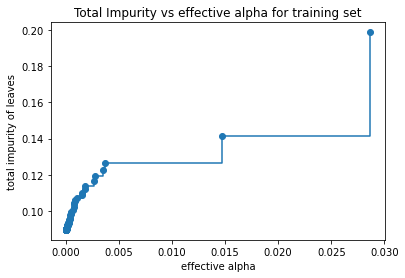

In [46]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
# ccp_alphas = ccp_alphas[ccp_alphas >= 0.]

In [47]:
ccp_alphas.shape

(83,)

In [48]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(train_x, train_y_bin)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.3014212989689927


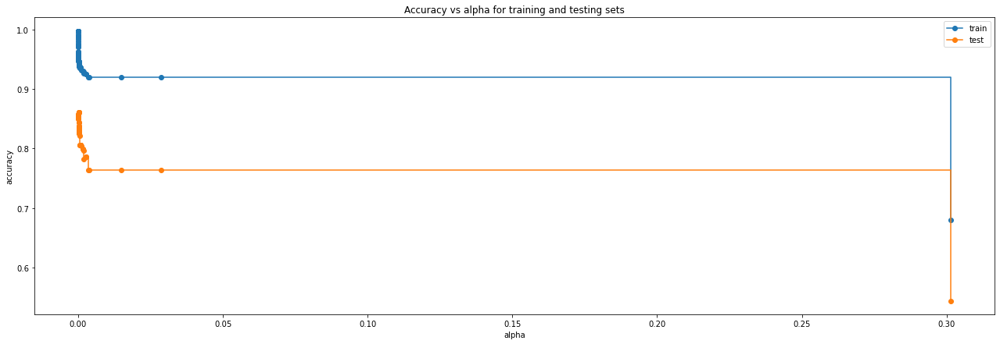

In [49]:
train_scores = [clf.score(train_x, train_y_bin) for clf in clfs]
test_scores = [clf.score(test_x, test_y_bin) for clf in clfs]

fig, ax = plt.subplots(figsize=(22,7))
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

No pruning will be performend, ccp_alpha is set to zero. 

In [50]:
pred_y_bin = classifier.predict(test_x)

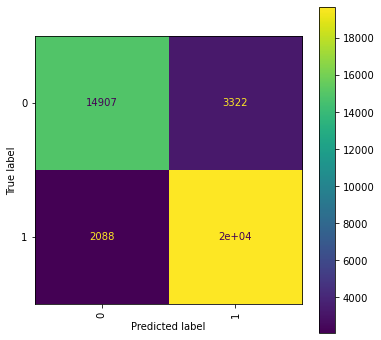

In [51]:
fig, ax = plt.subplots(figsize=(6, 6))
disp = ConfusionMatrixDisplay.from_predictions(test_y_bin, pred_y_bin, xticks_rotation='vertical', ax=ax)
plt.show()

In [52]:
print(classification_report(test_y_bin, pred_y_bin))

              precision    recall  f1-score   support

           0       0.88      0.82      0.85     18229
           1       0.86      0.90      0.88     21771

    accuracy                           0.86     40000
   macro avg       0.87      0.86      0.86     40000
weighted avg       0.87      0.86      0.86     40000



We got a good 86% F1-score with the decision tree approach. 

### Utility functions (cross validation)

In the following i decided to apply the **stratified K fold cross validation**.

In [76]:
# compute average per-class metrics  
def computeAverageMetrics(df_list):
    df_concat = pd.concat(df_list)
    grouped_by_row_index = df_concat.groupby(df_concat.index)
    df_avg = grouped_by_row_index.mean()
    df_avg.transpose()
    return df_avg

# compute average accuracy
def computeAverageAccuracy(accuracy_list):
    accuracy_avg = np.mean(accuracy_list)
    print("Average Accuracy score == {:.2f} %".format(accuracy_avg*100))
    
# compute average F1-score
def computeAverageF1Score(avg_df):
    f1_avg = avg_df.transpose()['f1-score'].mean()
    print("Average F1-score == {:.2f} %".format(f1_avg*100))


In [74]:
# this is preferred for the multi problem (stratified)
# this is not extremely necessary because the test set is not too small
# but is preferred considering the unbalanced nature of the dataset
# it will be used also for the binary case

from sklearn.metrics import RocCurveDisplay, auc


def applyStratifiedKFold(classifier, multi):
    skf = StratifiedKFold(n_splits=10, shuffle=True)
    
    df_all = pd.concat([train_x, test_x], axis=0)

    if not multi:
        gt_all = pd.concat([train_y_bin, test_y_bin], axis=0)
    else: 
        gt_all = pd.concat([train_y_multi, test_y_multi], axis=0)
    
    list_df = []
    list_accuracy = []
    list_f1score = []
    
    
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0, 1, 100)
    
    fig, ax = plt.subplots(figsize=(6, 6))
    k = 1
    for train_idx, test_idx in skf.split(df_all, gt_all):

        print(f'FOLD {k}:')

        # fit and predict using classifier
        x_tr = df_all.iloc[train_idx]
        y_tr = gt_all.iloc[train_idx]
        x_test = df_all.iloc[test_idx]
        y_test = gt_all.iloc[test_idx]

        clf = classifier
        clf.fit(x_tr, y_tr)
        y_pred = clf.predict(x_test)
        
        if not multi:
            viz = RocCurveDisplay.from_estimator(
                clf,
                x_test,
                y_test,
                name=f"ROC fold {k}",
                alpha=0.3,
                lw=1,
                ax=ax
                # plot_chance_level=(k == 10 - 1),
                )
            interp_tpr = np.interp(mean_fpr, viz.fpr, viz.tpr)
            interp_tpr[0] = 0.0
            tprs.append(interp_tpr)
            aucs.append(viz.roc_auc)

        # compute classification report
        cr = classification_report(y_test, y_pred, output_dict = True)

        f1score_tmp = f1_score(y_test, y_pred, average='macro')
        list_f1score.append(f1score_tmp)
        
        # store accuracy
        list_accuracy.append(cr['accuracy'])

        # store per-class metrics as a dataframe
        df = pd.DataFrame({k:v for k,v in cr.items() if k != 'accuracy'})
        display(df)
        list_df.append(df)
        k += 1
        print("")
    
    if not multi:
        mean_tpr = np.mean(tprs, axis=0)
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        std_auc = np.std(aucs)
        ax.plot(
            mean_fpr,
            mean_tpr,
            color="b",
            label=r"Mean ROC (AUC = %0.2f $\pm$ %0.2f)" % (mean_auc, std_auc),
            lw=2,
            alpha=0.8,
        )

        std_tpr = np.std(tprs, axis=0)
        tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
        tprs_lower = np.maximum(mean_tpr - std_tpr, 0)
        ax.fill_between(
            mean_fpr,
            tprs_lower,
            tprs_upper,
            color="grey",
            alpha=0.2,
            label=r"$\pm$ 1 std. dev.",
        )

        ax.set(
            xlim=[-0.05, 1.05],
            ylim=[-0.05, 1.05],
            xlabel="False Positive Rate",
            ylabel="True Positive Rate",
            title="Mean ROC curve with variability)",
        )
        ax.axis("square")
        ax.legend(loc="lower right")
        plt.show()

    return list_df, list_accuracy, list_f1score


#### DT binary cross validation

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.923194,0.961791,0.942493,0.947757
recall,0.933553,0.955625,0.944589,0.947600
f1-score,0.928345,0.958699,0.943522,0.947662
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.924475,0.959405,0.941940,0.946704
recall,0.929153,0.956631,0.942892,0.946640
f1-score,0.926808,0.958016,0.942412,0.946669
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.926728,0.961150,0.943939,0.948634
recall,0.932233,0.957888,0.945061,0.948560
f1-score,0.929472,0.959516,0.944494,0.948592
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.933363,0.957114,0.945239,0.948478
recall,0.924532,0.962288,0.943410,0.948560
f1-score,0.928927,0.959694,0.944310,0.948507
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.925787,0.957155,0.941471,0.945750
recall,0.924972,0.957637,0.941305,0.945760
f1-score,0.925380,0.957396,0.941388,0.945755
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.927209,0.960196,0.943703,0.948202
recall,0.930473,0.958265,0.944369,0.948160
f1-score,0.928838,0.959230,0.944034,0.948179
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.919835,0.960618,0.940226,0.945789
recall,0.931573,0.953614,0.942594,0.945600
f1-score,0.925667,0.957103,0.941385,0.945673
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.922229,0.964935,0.943582,0.949407
recall,0.939274,0.954745,0.947010,0.949120
f1-score,0.930674,0.959813,0.945243,0.949218
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.936698,0.960787,0.948742,0.952028
recall,0.931133,0.964048,0.947590,0.952080
f1-score,0.933907,0.962415,0.948161,0.952049
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.926213,0.954301,0.940257,0.944088
recall,0.919692,0.958140,0.938916,0.944160
f1-score,0.922941,0.956216,0.939579,0.944117
support,4545.000000,7955.000000,12500.000000,12500.000000


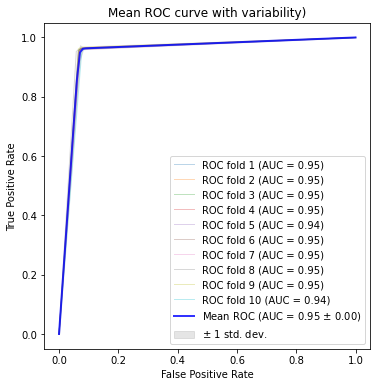

In [76]:
dt_bin = DecisionTreeClassifier(random_state=0, class_weight='balanced', ccp_alpha=0)
list_df, list_accuracy_dt, list_f1score_dt = applyStratifiedKFold(dt_bin, 0)

In [56]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.928226,0.926029,0.930451,4545.0
1,0.958837,0.960159,0.957524,7955.0
macro avg,0.943531,0.943094,0.943987,12500.0
weighted avg,0.947707,0.947750,0.947680,12500.0


In [78]:
computeAverageAccuracy(list_accuracy_dt)

Average Accuracy score == 94.76 %


In [79]:
computeAverageF1Score(df_avg)

Average F1-score == 94.46 %


-----------------------------------------------------------------------------------
### Logistic Regression

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.824808,0.900818,0.862813,0.873181
recall,0.826623,0.899686,0.863154,0.873120
f1-score,0.825714,0.900252,0.862983,0.873150
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.819235,0.899432,0.859334,0.870272
recall,0.824642,0.896040,0.860341,0.870080
f1-score,0.821930,0.897733,0.859831,0.870171
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.819332,0.900215,0.859774,0.870806
recall,0.826183,0.895915,0.861049,0.870560
f1-score,0.822743,0.898059,0.860401,0.870674
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.834936,0.898867,0.866901,0.875622
recall,0.821342,0.907228,0.864285,0.876000
f1-score,0.828083,0.903028,0.865556,0.875778
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.824519,0.897381,0.860950,0.870888
recall,0.819802,0.900314,0.860058,0.871040
f1-score,0.822154,0.898845,0.860499,0.870960
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.825912,0.893662,0.859787,0.869028
recall,0.812101,0.902200,0.857151,0.869440
f1-score,0.818948,0.897911,0.858429,0.869200
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.826483,0.896862,0.861673,0.871272
recall,0.818482,0.901823,0.860152,0.871520
f1-score,0.822463,0.899336,0.860899,0.871385
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.823399,0.894678,0.859038,0.868761
recall,0.814521,0.900189,0.857355,0.869040
f1-score,0.818936,0.897425,0.858180,0.868886
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.826661,0.901056,0.863858,0.874006
recall,0.826843,0.900943,0.863893,0.874000
f1-score,0.826752,0.900999,0.863876,0.874003
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.828180,0.900276,0.864228,0.874062
recall,0.825083,0.902200,0.863641,0.874160
f1-score,0.826628,0.901237,0.863933,0.874109
support,4545.000000,7955.000000,12500.000000,12500.000000


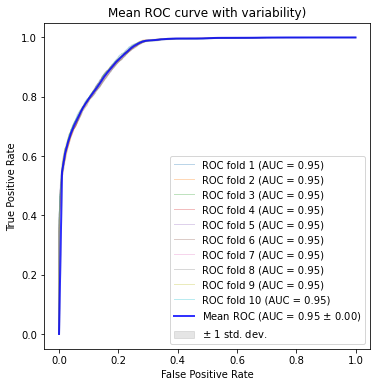

In [84]:
lr_bin = LogisticRegression(dual=False, C=0.1, class_weight='balanced', random_state=0, solver='lbfgs', n_jobs=-1, max_iter=10000)
list_df, list_accuracy_lr, list_f1score_lr = applyStratifiedKFold(lr_bin, 0)

In [85]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.823435,0.825346,0.821562,4545.0
1,0.899482,0.898325,0.900654,7955.0
macro avg,0.861459,0.861836,0.861108,12500.0
weighted avg,0.871832,0.871790,0.871896,12500.0


In [86]:
computeAverageAccuracy(list_accuracy_lr)
computeAverageF1Score(df_avg)

Average Accuracy score == 87.19 %
Average F1-score == 86.41 %


---------------------------------------------------------------------
## Support Vector Machine

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.821607,0.902263,0.861935,0.872937
recall,0.829923,0.897046,0.863484,0.872640
f1-score,0.825744,0.899647,0.862696,0.872776
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.826727,0.907649,0.867188,0.878226
recall,0.839824,0.899434,0.869629,0.877760
f1-score,0.833224,0.903523,0.868374,0.877962
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.822563,0.900441,0.861502,0.872125
recall,0.826183,0.898177,0.862180,0.872000
f1-score,0.824369,0.899308,0.861838,0.872060
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.838781,0.906297,0.872539,0.881748
recall,0.835644,0.908234,0.871939,0.881840
f1-score,0.837209,0.907264,0.872237,0.881792
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.823924,0.906563,0.865244,0.876516
recall,0.838064,0.897674,0.867869,0.876000
f1-score,0.830934,0.902097,0.866515,0.876222
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.820624,0.903983,0.862303,0.873673
recall,0.833443,0.895915,0.864679,0.873200
f1-score,0.826984,0.899931,0.863457,0.873407
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.818531,0.909033,0.863782,0.876126
recall,0.843564,0.893149,0.868357,0.875120
f1-score,0.830859,0.901021,0.865940,0.875510
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.825455,0.906440,0.865948,0.876994
recall,0.837624,0.898806,0.868215,0.876560
f1-score,0.831495,0.902607,0.867051,0.876751
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.813559,0.903942,0.858751,0.871079
recall,0.834323,0.890761,0.862542,0.870240
f1-score,0.823811,0.897303,0.860557,0.870581
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.830844,0.904001,0.867422,0.877401
recall,0.832123,0.903206,0.867664,0.877360
f1-score,0.831483,0.903603,0.867543,0.877380
support,4545.000000,7955.000000,12500.000000,12500.000000


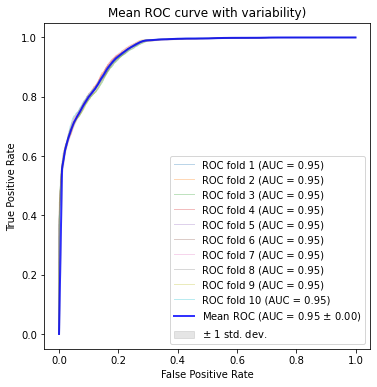

Average Accuracy score == 87.53 %
Average F1-score == 86.81 %


In [87]:
lsvm_bin = LinearSVC(dual=False, tol=1e-05, class_weight='balanced', random_state=0, max_iter=10000)
list_df, list_accuracy_lsvm, list_f1score_lsvm = applyStratifiedKFold(lsvm_bin, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_lsvm)
computeAverageF1Score(df_avg)

## K-Nearest Neighbours

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.931558,0.960784,0.946171,0.950158
recall,0.931353,0.960905,0.946129,0.950160
f1-score,0.931456,0.960845,0.946150,0.950159
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.933555,0.958673,0.946114,0.949540
recall,0.927393,0.962288,0.944840,0.949600
f1-score,0.930464,0.960477,0.945470,0.949564
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.928587,0.959869,0.944228,0.948495
recall,0.929813,0.959145,0.944479,0.948480
f1-score,0.929200,0.959507,0.944353,0.948487
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.925242,0.957621,0.941431,0.945848
recall,0.925853,0.957260,0.941556,0.945840
f1-score,0.925547,0.957440,0.941494,0.945844
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.927257,0.960559,0.943908,0.948451
recall,0.931133,0.958265,0.944699,0.948400
f1-score,0.929191,0.959411,0.944301,0.948423
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.923915,0.961203,0.942559,0.947645
recall,0.932453,0.956128,0.944291,0.947520
f1-score,0.928165,0.958659,0.943412,0.947571
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.929231,0.960126,0.944678,0.948892
recall,0.930253,0.959522,0.944888,0.948880
f1-score,0.929742,0.959824,0.944783,0.948886
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.922135,0.958502,0.940318,0.945279
recall,0.927613,0.955248,0.941431,0.945200
f1-score,0.924866,0.956872,0.940869,0.945235
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.923553,0.954226,0.938890,0.943073
recall,0.919692,0.956505,0.938099,0.943120
f1-score,0.921618,0.955364,0.938491,0.943094
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.929809,0.961466,0.945637,0.949955
recall,0.932673,0.959774,0.946223,0.949920
f1-score,0.931239,0.960619,0.945929,0.949936
support,4545.000000,7955.000000,12500.000000,12500.000000


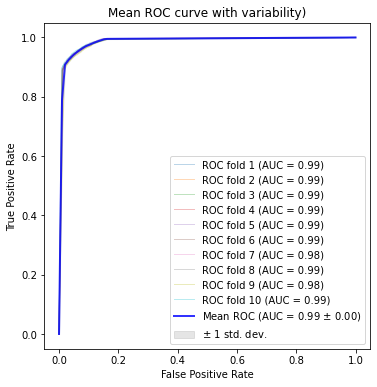

In [83]:
# n_neighbors=5,    weights='uniform',    algorithm='auto'    --> avg_F1 == 92.23
# n_neighbors=10,   weights='uniform',    algorithm='auto'    --> avg_F1 == 91.99
# n_neighbors=5,    weights='distance',   algorithm='auto'    --> avg_F1 == 94.34
# n_neighbors=6,    weights='distance',   algorithm='auto'    --> avg_F1 == 94.40
# n_neighbors=7,    weights='distance',   algorithm='auto'    --> avg_F1 == 94.46
knn_bin = KNeighborsClassifier(n_neighbors=7, weights='distance', algorithm='auto', n_jobs=-1)
list_df, list_accuracy_knn, list_f1score_knn = applyStratifiedKFold(knn_bin, 0)

In [84]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_knn)
computeAverageF1Score(df_avg)

Average Accuracy score == 94.77 %
Average F1-score == 94.46 %


## Random Forest

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.938744,0.967966,0.953355,0.957341
recall,0.944114,0.964802,0.954458,0.957280
f1-score,0.941422,0.966381,0.953901,0.957306
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.933246,0.966271,0.949758,0.954263
recall,0.941254,0.961534,0.951394,0.954160
f1-score,0.937233,0.963896,0.950565,0.954202
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.939127,0.963972,0.951549,0.954938
recall,0.936854,0.965305,0.951079,0.954960
f1-score,0.937989,0.964638,0.951313,0.954948
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.935691,0.961003,0.948347,0.951799
recall,0.931573,0.963419,0.947496,0.951840
f1-score,0.933627,0.962210,0.947919,0.951817
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.940866,0.966671,0.953768,0.957288
recall,0.941694,0.966185,0.953939,0.957280
f1-score,0.941280,0.966428,0.953854,0.957284
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.939735,0.963864,0.951800,0.955091
recall,0.936634,0.965682,0.951158,0.955120
f1-score,0.938182,0.964772,0.951477,0.955104
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.938380,0.964681,0.951531,0.955118
recall,0.938174,0.964802,0.951488,0.955120
f1-score,0.938277,0.964741,0.951509,0.955119
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.941968,0.965361,0.953665,0.956856
recall,0.939274,0.966939,0.953106,0.956880
f1-score,0.940619,0.966150,0.953384,0.956867
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.939327,0.965790,0.952559,0.956168
recall,0.940154,0.965305,0.952729,0.956160
f1-score,0.939740,0.965548,0.952644,0.956164
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.937555,0.964663,0.951109,0.954807
recall,0.938174,0.964299,0.951237,0.954800
f1-score,0.937864,0.964481,0.951173,0.954803
support,4545.000000,7955.000000,12500.000000,12500.000000


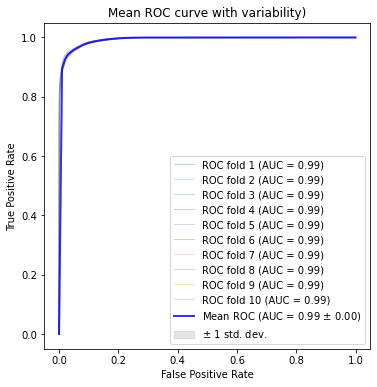

Average Accuracy score == 95.54 %
Average F1-score == 95.27 %


In [88]:
randf = RandomForestClassifier(class_weight = 'balanced', n_jobs=-1)
list_df, list_accuracy_randf, list_f1score_randf = applyStratifiedKFold(randf, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_randf)
computeAverageF1Score(df_avg)

## Multi-Layer Perceptron

FOLD 1:


,0,1,macro avg,weighted avg
precision,0.948298,0.908026,0.928162,0.922669
recall,0.827283,0.974230,0.900756,0.920800
f1-score,0.883666,0.939964,0.911815,0.919494
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 2:


,0,1,macro avg,weighted avg
precision,0.913064,0.922394,0.917729,0.919001
recall,0.859626,0.953237,0.906431,0.919200
f1-score,0.885539,0.937562,0.911551,0.918646
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 3:


,0,1,macro avg,weighted avg
precision,0.854230,0.953259,0.903745,0.917252
recall,0.921892,0.910119,0.916006,0.914400
f1-score,0.886772,0.931190,0.908981,0.915040
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 4:


,0,1,macro avg,weighted avg
precision,0.906746,0.925585,0.916166,0.918736
recall,0.866447,0.949089,0.907768,0.919040
f1-score,0.886139,0.937190,0.911664,0.918628
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 5:


,0,1,macro avg,weighted avg
precision,0.922292,0.910880,0.916586,0.915030
recall,0.835644,0.959774,0.897709,0.914640
f1-score,0.876833,0.934688,0.905760,0.913652
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 6:


,0,1,macro avg,weighted avg
precision,0.908606,0.923312,0.915959,0.917965
recall,0.861826,0.950471,0.906149,0.918240
f1-score,0.884598,0.936695,0.910646,0.917752
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 7:


,0,1,macro avg,weighted avg
precision,0.889620,0.938185,0.913902,0.920527
recall,0.891969,0.936769,0.914369,0.920480
f1-score,0.890793,0.937476,0.914135,0.920502
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 8:


,0,1,macro avg,weighted avg
precision,0.928571,0.923727,0.926149,0.925488
recall,0.860946,0.962162,0.911554,0.925360
f1-score,0.893481,0.942553,0.918017,0.924710
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 9:


,0,1,macro avg,weighted avg
precision,0.928798,0.912371,0.920584,0.918343
recall,0.838064,0.963294,0.900679,0.917760
f1-score,0.881101,0.937141,0.909121,0.916765
support,4545.000000,7955.000000,12500.000000,12500.000000



FOLD 10:


,0,1,macro avg,weighted avg
precision,0.909876,0.921139,0.915508,0.917044
recall,0.857426,0.951477,0.904451,0.917280
f1-score,0.882873,0.936062,0.909468,0.916723
support,4545.000000,7955.000000,12500.000000,12500.000000


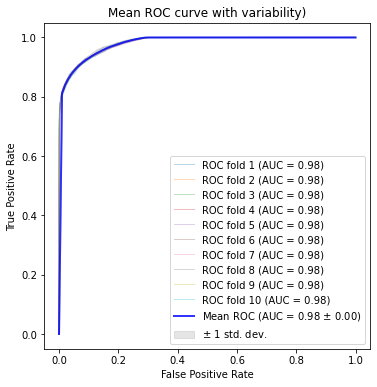

Average Accuracy score == 91.87 %
Average F1-score == 91.29 %


In [89]:
# very long running time
mlp = MLPClassifier(random_state=123, solver='adam', max_iter=10000)
list_df, list_accuracy_mlp, list_f1score_mlp = applyStratifiedKFold(mlp, 0)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy_mlp)
computeAverageF1Score(df_avg)

# 5. Validation

The difference between the performance of machine learning models are true and reliable or are they just due to statistical chance?

Now we need to: formulate an hypothesis, determine the significance level, determine the type of test, calculate the test statistics and the p values, and finally make decisions. 

The paired t-test wants to find out if there is a real difference between the classifiers, so assuming we are interested in the accuracy, we start by calculating the difference of the accuracies between the models (learned with a k-fold cross validation approach). 

The assumption is that accuracies are drawn from a normal distribution (with unknown variance). The Null Hypothesis states that the accuracies of two models A and B are drawn from the same distribution. Hence, the difference in the accuracies has an expected value equal to 0 (E[diff] = 0). Basically, there is now difference between the two models. The Alternative Hypothesis states that the accuracies are drawn from two different distributions, basically the models are actually different, so one is better than the other. 


We need to:
    - take a sample of N observations from the k-fold cross validation (the assumption is that these results come from a normal distribution with fixed mean and variance)
    - copute the sample mean and sample variance for these observations
    - compute the t-statistic
    - use the t-distribution with N-1 degress of fredoom to estimate how likely it is that the true mean is in a given range
    - reject the null hypothesis at significance level p if the t-statistic does not lie in the interval ... TO DO [-t_{p/2, n-1, +t_{p/2,n-1}]

 TO DO CHECK
 We could then select and use the paired Student’s t-test to check if the difference in the mean accuracy between the two models is statistically significant, e.g. reject the null hypothesis that assumes that the two samples have the same distribution.

In fact, this is a common way to compare classifiers with perhaps hundreds of published papers using this methodology.

The problem is, a key assumption of the paired Student’s t-test has been violated.

Namely, the observations in each sample are not independent. As part of the k-fold cross-validation procedure, a given observation will be used in the training dataset (k-1) times. This means that the estimated skill scores are dependent, not independent, and in turn that the calculation of the t-statistic in the test will be misleadingly wrong along with any interpretations of the statistic and p-value.

Unfortunately, selecting an appropriate statistical hypothesis test for model selection in applied machine learning is more challenging than it first appears

Let's say that we want to set a level of significance (alpha) of 0.05. We want to be pretty sure that the models are statistically different to each other. If the p-value returned by the function is smaller than alpha we can successfully reject the null hypothesis. 

In [ ]:
! pip install mlxtend

#### Binary Tree Vs Others

In [91]:
# this involves 5 repeats of 2-fold cross validation
# https://rasbt.github.io/mlxtend/user_guide/evaluate/paired_ttest_5x2cv/
from mlxtend.evaluate import paired_ttest_5x2cv
alpha=0.05

In [93]:
from scipy.stats import wilcoxon

# t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=lr_bin, X=train_x, y=train_y_bin)

# print('t statistic: %.3f' % t)
# print('p value: %.3f' % p)

# if p > alpha:
#   print("Fail to reject null hypotesis")
# else:
#   print("Null Hypotesis Rejected")


# inserito questo, da qui in poi 


stat, p = wilcoxon(list_f1score_dt, list_f1score_lr)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")
else:
    print("Decision Tree - Logistic Regression Null Hypothesis Rejected")

p: 0.001953125, alpha: 0.05
Decision Tree - Logistic Regression Null Hypothesis Rejected


In [94]:
# t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=lsvm_bin, X=train_x, y=train_y_bin)

# print('t statistic: %.3f' % t)
# print('p value: %.3f' % p)

# if p > alpha:
#   print("Fail to reject null hypotesis")
# else:
#   print("Null Hypotesis Rejected")


stat, p = wilcoxon(list_f1score_dt, list_f1score_lsvm)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")
else:
    print("Decision Tree - LSVM Null Hypothesis Rejected")

p: 0.001953125, alpha: 0.05
Decision Tree - LSVM Null Hypothesis Rejected


In [95]:
# # VERY long running time (approx: 1h)
# t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=knn_bin, X=train_x, y=train_y_bin)

# print('t statistic: %.3f' % t)
# print('p value: %.3f' % p)

# if p > alpha:
#   print("Fail to reject null hypotesis")
# else:
#   print("Null Hypotesis Rejected")

stat, p = wilcoxon(list_f1score_dt, list_f1score_knn)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Cannot reject the Null Hypothesis")
else:
    print("Decision Tree - KNN Null Hypothesis Rejected")

p: 0.001953125, alpha: 0.05
Decision Tree - KNN Null Hypothesis Rejected


In [96]:
# t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=randf, X=train_x, y=train_y_bin)

# print('t statistic: %.3f' % t)
# print('p value: %.3f' % p)

# if p > alpha:
#   print("Fail to reject null hypotesis")
# else:
#   print("Null Hypotesis Rejected")


stat, p = wilcoxon(list_f1score_dt, list_f1score_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Decision Tree - Random Forest: Cannot reject the Null Hypothesis")
else:
    print("Decision Tree - Random Forest: Null Hypothesis Rejected")

p: 0.001953125, alpha: 0.05
Decision Tree - Random Forest: Null Hypothesis Rejected


In [97]:
# # long running time
# t, p = paired_ttest_5x2cv(estimator1=dt_bin, estimator2=mlp, X=train_x, y=train_y_bin)

# print('t statistic: %.3f' % t)
# print('p value: %.3f' % p)

# if p > alpha:
#   print("Fail to reject null hypotesis")
# else:
#   print("Null Hypotesis Rejected")

stat, p = wilcoxon(list_f1score_dt, list_f1score_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Decision Tree - Random Forest: Cannot reject the Null Hypothesis")
else:
    print("Decision Tree - Multi-Layer Perceptron: Null Hypothesis Rejected")

p: 0.001953125, alpha: 0.05
Decision Tree - Multi-Layer Perceptron: Null Hypothesis Rejected


#### Logistic Regression vs Others

In [98]:
stat, p = wilcoxon(list_f1score_lr, list_f1score_lsvm)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Logistic Regression - LSVM: Cannot reject the Null Hypothesis")
else:
    print("Logistic Regression - LSVM: Null Hypothesis Rejected")    

p: 0.013671875, alpha: 0.05
Logistic Regression - LSVM: Null Hypothesis Rejected


In [99]:
stat, p = wilcoxon(list_f1score_lr, list_f1score_knn)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Logistic Regression - KNN: Cannot reject the Null Hypothesis")
else:
    print("Logistic Regression - KNN: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
Logistic Regression - KNN: Null Hypothesis Rejected


In [100]:
stat, p = wilcoxon(list_f1score_lr, list_f1score_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Logistic Regression - Random Forest: Cannot reject the Null Hypothesis")
else:
    print("Logistic Regression - Random Forest: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
Logistic Regression - Random Forest: Null Hypothesis Rejected


In [101]:
stat, p = wilcoxon(list_f1score_lr, list_f1score_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Logistic Regression - Multi-Layer Perceptron: Cannot reject the Null Hypothesis")
else:
    print("Logistic Regression - Multi-Layer Perceptron: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
Logistic Regression - Multi-Layer Perceptron: Null Hypothesis Rejected


#### Support Vector Machine Vs Others

In [102]:
stat, p = wilcoxon(list_f1score_lsvm, list_f1score_knn)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("LSVM - KNN: Cannot reject the Null Hypothesis")
else:
    print("LSVM - KNN: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
LSVM - KNN: Null Hypothesis Rejected


In [103]:
stat, p = wilcoxon(list_f1score_lsvm, list_f1score_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("LSVM - Random Forest: Cannot reject the Null Hypothesis")
else:
    print("LSVM - Random Forest: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
LSVM - Random Forest: Null Hypothesis Rejected


In [104]:
stat, p = wilcoxon(list_f1score_lsvm, list_f1score_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("LSVM - Multi-Layer Perceptron: Cannot reject the Null Hypothesis")
else:
    print("LSVM - Multi-Layer Perceptron: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
LSVM - Multi-Layer Perceptron: Null Hypothesis Rejected


#### KNN Vs Others

In [105]:
stat, p = wilcoxon(list_f1score_knn, list_f1score_randf)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
        print("KNN - Random Forest: Cannot reject the Null Hypothesis")
else:
    print("KNN - Random Forest: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
KNN - Random Forest: Null Hypothesis Rejected


In [106]:
stat, p = wilcoxon(list_f1score_knn, list_f1score_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("KNN - Multi-Layer Perceptron: Cannot reject the Null Hypothesis")
else:
    print("KNN - Multi-Layer Perceptron: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
KNN - Multi-Layer Perceptron: Null Hypothesis Rejected


#### Random Forest Vs Others

In [107]:
stat, p = wilcoxon(list_f1score_randf, list_f1score_mlp)
print(f"p: {p}, alpha: {alpha}")
if(p > alpha):
    print("Random Forest - Multi-Layer Perceptron: Cannot reject the Null Hypothesis")
else:
    print("Random Forest - Multi-Layer Perceptron: Null Hypothesis Rejected")    

p: 0.001953125, alpha: 0.05
Random Forest - Multi-Layer Perceptron: Null Hypothesis Rejected


#### No more possible couple. 

---------------------------------------------------------------------

-------------------------------------------------------------------------

## Multi-class problem

We have a ten-class classification problem in which each sample belongs to one of the following classes: `Fuzzers`, `Analysis`, `Backdoors`, `DoS`, `Exploits`, `Generic`, `Reconnaissance`, `Shellcode`, `Worms` and `Normal`. There are many different classification algorithms suitable for a problem like this, and many different ways to approach the problem of multiclass classification. Many classification algorithms inherently supprot multiclass data (e.g., decision trees, nearest neighbors, Naive Bayes), whereas other do not (e.g., support vector machines). Even if our algorithm of choice does not inherently support multiple classes, there are some clever techniques for effectively achieving this. 

Essentially, a multiclass problem can be split into multiple binary classification problems. A strategy known as *one-versus-all*, also called *binary relevance method*, fits one classifier per class, with data belonging to the class fitted against the aggregate of all other classes. Another less commonly used strategy is *one-versus-one*, in which there are *n_classes * (n_classes - 1) / 2* classifier constructed, one for each unique pair of classes. In this case, during the prediction phase, each sample is run through all the classifiers, and the classification confidences for each of the classes are tallied. The class with the highest aggregate confidence is selectedd as the prediction result. 
One-versus-all scales linearly with the number of class and, in general, has better model interpretability because each class is only represented by one classifier (as opposed to each class being represented by *n_class - 1* classifiers for one-versus-one). In contrast, the one-versus-one strategy does not scale well with the number of classes because of its polynomial complexity. 

In [38]:
# performed only on the training set
train['attack_cat'].unique() 

array(['Normal', 'Backdoor', 'Analysis', 'Fuzzers', 'Shellcode',
       'Reconnaissance', 'Exploits', 'DoS', 'Worms', 'Generic'],
      dtype=object)

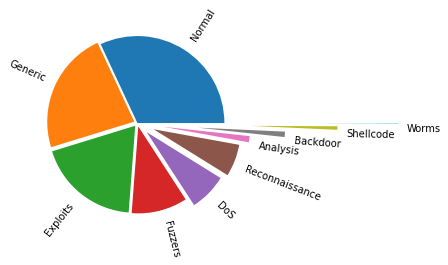

In [39]:
# multiclass problem --> imbalanced
wedges = train['attack_cat'].value_counts()
myexplode = [0, 0.04, 0.04, 0.04, 0.15, 0.2, 0.3, 0.7, 1.3, 2]
plt.pie(np.array(wedges), labels= wedges.index, explode=myexplode, rotatelabels=True)
plt.show()

### Imbalance Problem

In [ ]:
tree_multi = DecisionTreeClassifier(criterion='gini', random_state=0, ccp_alpha=0)
tree_multi = tree_multi.fit(train_x, train_y_multi)
pred_y_multi = tree_multi.predict(test_x)

In [ ]:
# path = tree_multi.cost_complexity_pruning_path(train_x, train_y_multi)
# ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [ ]:
# fig, ax = plt.subplots()
# ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
# ax.set_xlabel("effective alpha")
# ax.set_ylabel("total impurity of leaves")
# ax.set_title("Total Impurity vs effective alpha for training set")

In [ ]:
# ccp_alphas = ccp_alphas[ccp_alphas > 0]
# ccp_alphas

In [ ]:
# clfs = []
# # i = 0
# for ccp_alpha in ccp_alphas:
#     clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
#     clf.fit(train_x, train_y_bin)
#     clfs.append(clf)
# #     print(i)
# #     i += 1
# print(
#     "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
#         clfs[-1].tree_.node_count, ccp_alphas[-1]
#     )
# )

In [ ]:
# train_scores = [clf.score(train_x, train_y_bin) for clf in clfs]
# test_scores = [clf.score(test_x, test_y_bin) for clf in clfs]

# fig, ax = plt.subplots(figsize=(20,10))
# ax.set_xlabel("alpha")
# ax.set_ylabel("accuracy")
# ax.set_title("Accuracy vs alpha for training and testing sets")
# ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
# ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
# ax.legend()
# plt.show()

In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y_multi, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
print(classification_report(test_y_multi, pred_y_multi))

With just a few lines of code and no tuning at all, a decent classification accuracy is obtained. However, this number is quite meaningless without considering the distribution of the test set (shown below). We know that such a measure is not acceptable for an unbalanced dataset, because we are interested in the *minority* class. If we take a look at some other measure like the **precision** (percentage of tuples labeled as positive and actually such, *TP/(TP+FP)*) and the **recall**  (percentage of positive tuples labeled as such, *TP/P*) the results are not very good. For example, the 'Analysis' attack category has a precision = 2% and a recall = 9%. 
A good parameter to look at is the F1-Score, e.g. an harmonic mean of precision and recall.

In [ ]:
test_attack_cats = test_y_bin.value_counts()
test_attack_cats.plot(kind='barh', figsize=(6,3), fontsize=10);

In the confusion matrix, the diagonal values are the counts of the correctly classified samples. Each row represents the true class, and each column represents the predicted class. For instance, the number in the second row and in third column represents the number of samples that are actually of class `Backdoor` that were classfied as `DoS`.

Simlarly to the training set, the test distribution is not balanced across categories:

In [ ]:
test_y_multi.value_counts().apply(lambda x: (x / float(len(test_y_multi))*100))

We see that the 44% of the test data belong to the `Normal` class, 23% to the `Generic` one, 14% to `Exploits`, 7% to `Fuzzers`, whereas only the 0,005% of the data belongs to the `Worms` class, the 0,04% belongs to the `Shellcode`, 0,07% to `Backdoor` and 0,08% to `Analysis`. We can see the problem in the `Shellcode` row for example, the number of times it is correctly classified is similar to the number of times it is wrongly classified. It could have been not enough information for the trained model to learn from the latter classes to correctly identify them. We must face the problem of class imbalance. 

### Sampling

As we know, there are two possible remedies: undersampling (e.g., prioritize the removal of samples that are very similar to other samples that will remain in the dataset) and oversampling (e.g., generate synthetic data points for minority classes using SMOTE). A popular method is to first oversample the minority class and then undersample to tighten the class distribution discrepancy. 

In [ ]:
print(pd.Series(train_y_multi).value_counts())

In [ ]:
# !pip install imblearn

In [ ]:
from imblearn.over_sampling import SMOTE

mean_class_size = int(pd.Series(train_y_multi).value_counts().sum() / 10)

# a lot of values were tried
strategy = { 
            #'Fuzzers': mean_class_size, 
            2: 40000, # DoS
            0: 40000, # Analysis
            1: 40000, # Backdoor
            8: 40000, # Shellcode
            9: 40000  # Worms
           }

sm = SMOTE(sampling_strategy = strategy, random_state = 0)
train_x_sm, train_y_sm = sm.fit_resample(train_x, train_y_multi)
print(pd.Series(train_y_sm).value_counts())


In [ ]:
test_attack_cats = train_y_sm.value_counts()
test_attack_cats.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

In [ ]:
# OVERFITTING CHECK (commented because time-consuming, also tried with classification_report)
# values = [i for i in range(10, 25)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_sm, train_y_sm)
#     pred_yt = classifier.predict(test_x)
#     print(accuracy_score(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_sm)
#     print(accuracy_score(train_y_sm, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(criterion='gini', random_state=0, class_weight='balanced', ccp_alpha=0)
classifier = classifier.fit(train_x_sm, train_y_sm)
pred_y = classifier.predict(test_x)
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()
print(classification_report(test_y_multi, pred_y))

We can see an overfitting problem after a depth of 16 levels, thanks to the loop test. This is why we set max_depth to 16. 

TO DO correct Here a lot of experimentation can be made: my idea was to try first SMOTE to all the minority classes with a sampling set to *mean_class_size*, then SMOTE to all the minority classes with the strategy set to *auto*, then some experimentation mixing these values. For example, applying SMOTE only to those features with an F-score less than 0.50, or do the latter but adding also those features that worsen their measures (like Worms), and something similar. I found that the best, worst, solution is applying SMOTE to all those features with an F-score less than 50%. When I evaluated these combinations I evaluated the total sum of the F-scores of all the features. When I said best/worst is because the relative solution is in any case worst with respect to the base one without over-sampling. 

Let's see what happens applying also under-sampling:

In [ ]:
print(pd.Series(train_y_sm).value_counts())

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

# mean_class_size = int(pd.Series(train_y_sm).value_counts().sum() / 10)

# a lot of combinations has been tried
ratio = {
         6: mean_class_size, 
         3: mean_class_size,
         5: mean_class_size
        }

rus = RandomUnderSampler(sampling_strategy = ratio, random_state = 0)
train_x_sm_rus, train_y_sm_rus = rus.fit_resample(train_x_sm, train_y_sm)
print(pd.Series(train_y_sm_rus).value_counts())

In [ ]:
test_attack_cats_sm_rus = train_y_sm_rus.value_counts()
test_attack_cats_sm_rus.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

In [ ]:
# OVERFITTING CHECK (commented because time-consuming)
# values = [i for i in range(10, 30)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_sm_rus, train_y_sm_rus)
#     pred_yt = classifier.predict(test_x)
#     print(classification_report(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_sm_rus)
#     print(classification_report(train_y_sm_rus, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x_sm_rus, train_y_sm_rus)
pred_y = classifier.predict(test_x)
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
print(classification_report(test_y_multi, pred_y))

Also here, some experimentation has been done. We can notice that the scores change a bit for some features but basically their sum remains the same. 

Our last chance is to perform only undersampling:

In [ ]:
# mean_class_size = int(pd.Series(train_y_sm).value_counts().sum() / 10)

# a lot of combinations has been tried
ratio = {
         6: mean_class_size, 
         3: mean_class_size,
         5: mean_class_size
        }

orus = RandomUnderSampler(sampling_strategy = ratio, random_state = 0)
train_x_orus, train_y_orus = orus.fit_resample(train_x, train_y_multi)
print(pd.Series(train_y_orus).value_counts())

In [ ]:
test_attack_cats_orus = train_y_orus.value_counts()
test_attack_cats_orus.plot(kind='barh', logx=True, figsize=(20,10), fontsize=20);

In [ ]:
# OVERFITTING CHECK (commented because time-consuming)
# values = [i for i in range(10, 30)]
# for i in values:
#     print(f"Value: {i}\n")
#     classifier = DecisionTreeClassifier(max_depth=i, random_state=0)
#     classifier = classifier.fit(train_x_orus, train_y_orus)
#     pred_yt = classifier.predict(test_x)
#     print(classification_report(test_y, pred_yt))
#     pred_yt = classifier.predict(train_x_orus)
#     print(classification_report(train_y_orus, pred_yt))
#     print(" ")

classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x_orus, train_y_orus)
pred_y = classifier.predict(test_x)

In [ ]:
print(classification_report(test_y_multi, pred_y))

Also in this case some experiments have been done, but the point remains the same, we can get some better behaviour in classifying some minority classes but with no such a general great improvement. 
We can conclude that some features like *Analysis* and *Backdoors* probably do not have a suitable fingerprint on the network statistics, because even raising up their instances, making them the majority classes (e.g., first oversample them to the max, and then undersample the other major categories), makes a little difference on their metrics. Another possible reason is the nature of the data that were sampled when the dataset was created. 
Furthermore, the unbalanced multiclass classification problem is hard to solve.


### Decision Tree multiclass cross-validation

FOLD 1:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.100686,0.067278,0.397042,0.851322,0.714822,0.993243,0.929432,0.857143,0.636364,0.750000,0.629733,0.854886
recall,0.357724,0.392857,0.441214,0.557323,0.640875,0.981722,0.933113,0.769912,0.671233,0.428571,0.617454,0.799840
f1-score,0.157143,0.114883,0.417964,0.673643,0.675831,0.987449,0.931269,0.811189,0.653333,0.545455,0.596816,0.819948
support,123.000000,112.000000,791.000000,2137.000000,1189.000000,2845.000000,4545.000000,678.000000,73.000000,7.000000,12500.000000,12500.000000



FOLD 2:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.096509,0.082616,0.406475,0.854962,0.695111,0.989027,0.928429,0.868720,0.535211,0.666667,0.612373,0.852992
recall,0.382114,0.428571,0.428571,0.576509,0.657696,0.982074,0.921892,0.790560,0.520548,0.571429,0.625996,0.800800
f1-score,0.154098,0.138528,0.417231,0.688653,0.675886,0.985538,0.925149,0.827799,0.527778,0.615385,0.595604,0.820202
support,123.000000,112.000000,791.000000,2137.000000,1189.000000,2845.000000,4545.000000,678.000000,73.000000,7.000000,12500.000000,12500.000000



FOLD 3:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.087678,0.069610,0.385888,0.851417,0.721137,0.991537,0.933659,0.895000,0.711864,0.571429,0.621922,0.858232
recall,0.300813,0.366071,0.442478,0.576509,0.682927,0.988401,0.925853,0.792035,0.575342,0.571429,0.622186,0.806000
f1-score,0.135780,0.116976,0.412250,0.687500,0.701512,0.989967,0.929739,0.840376,0.636364,0.571429,0.602189,0.825722
support,123.000000,112.000000,791.000000,2137.000000,1189.000000,2845.000000,4545.000000,678.000000,73.000000,7.000000,12500.000000,12500.000000



FOLD 4:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.078167,0.085670,0.387471,0.842636,0.716742,0.991160,0.929123,0.894295,0.605634,0.777778,0.630868,0.854241
recall,0.235772,0.495495,0.422250,0.586336,0.666106,0.985237,0.925853,0.786136,0.589041,0.875000,0.656723,0.804560
f1-score,0.117409,0.146082,0.404114,0.691501,0.690497,0.988190,0.927485,0.836735,0.597222,0.823529,0.622276,0.823469
support,123.000000,111.000000,791.000000,2137.000000,1189.000000,2845.000000,4545.000000,678.000000,73.000000,8.000000,12500.000000,12500.000000



FOLD 5:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.102908,0.075163,0.415385,0.857746,0.699911,0.991890,0.927922,0.871429,0.671429,0.625,0.623878,0.855961
recall,0.377049,0.414414,0.443742,0.569958,0.661060,0.988752,0.920572,0.809735,0.635135,0.625,0.644542,0.803600
f1-score,0.161687,0.127248,0.429095,0.684847,0.679931,0.990319,0.924232,0.839450,0.652778,0.625,0.611459,0.822861
support,122.000000,111.000000,791.000000,2137.000000,1189.000000,2845.000000,4545.000000,678.000000,74.000000,8.000,12500.000000,12500.000000



FOLD 6:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.088795,0.072310,0.395833,0.855062,0.710037,0.992223,0.931510,0.884984,0.666667,0.888889,0.648631,0.857321
recall,0.344262,0.369369,0.456384,0.576977,0.642557,0.986643,0.921672,0.817109,0.621622,1.000000,0.673660,0.803600
f1-score,0.141176,0.120944,0.423958,0.689019,0.674614,0.989425,0.926565,0.849693,0.643357,0.941176,0.639993,0.823835
support,122.000000,111.000000,791.000000,2137.000000,1189.000000,2845.000000,4545.000000,678.000000,74.000000,8.000000,12500.000000,12500.000000



FOLD 7:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.085470,0.073826,0.393655,0.828921,0.697282,0.991507,0.928256,0.879599,0.609756,0.888889,0.637716,0.849487
recall,0.327869,0.396396,0.422980,0.571629,0.626263,0.984886,0.925193,0.774669,0.675676,1.000000,0.670556,0.798000
f1-score,0.135593,0.124470,0.407791,0.676642,0.659867,0.988186,0.926722,0.823806,0.641026,0.941176,0.632528,0.817618
support,122.000000,111.000000,792.000000,2136.000000,1188.000000,2845.000000,4545.000000,679.000000,74.000000,8.000000,12500.000000,12500.000000



FOLD 8:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.096000,0.087542,0.401451,0.841128,0.680759,0.991827,0.927932,0.841503,0.692308,0.857143,0.641759,0.849026
recall,0.393443,0.464286,0.419192,0.572566,0.664141,0.981019,0.912211,0.758468,0.616438,0.750000,0.653176,0.795760
f1-score,0.154341,0.147309,0.410130,0.681337,0.672348,0.986393,0.920004,0.797831,0.652174,0.800000,0.622187,0.815814
support,122.000000,112.000000,792.000000,2136.000000,1188.000000,2845.000000,4545.000000,679.000000,73.000000,8.000000,12500.000000,12500.000000



FOLD 9:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.094262,0.078400,0.399050,0.850144,0.696113,0.989425,0.925294,0.904362,0.616438,0.625,0.617849,0.853092
recall,0.377049,0.437500,0.424242,0.552434,0.663300,0.986643,0.918372,0.793814,0.616438,0.625,0.639479,0.797520
f1-score,0.150820,0.132972,0.411261,0.669694,0.679310,0.988032,0.921820,0.845490,0.616438,0.625,0.604084,0.817697
support,122.000000,112.000000,792.000000,2136.000000,1188.000000,2845.000000,4545.000000,679.000000,73.000000,8.000,12500.000000,12500.000000



FOLD 10:


,0,1,2,3,4,5,6,7,8,9,macro avg,weighted avg
precision,0.069915,0.072848,0.419277,0.837022,0.715669,0.991850,0.934140,0.881494,0.650000,0.800000,0.637221,0.856505
recall,0.268293,0.392857,0.439949,0.583996,0.684343,0.983831,0.917492,0.800885,0.534247,0.500000,0.610589,0.803280
f1-score,0.110924,0.122905,0.429365,0.687982,0.699656,0.987824,0.925741,0.839258,0.586466,0.615385,0.600551,0.824244
support,123.000000,112.000000,791.000000,2137.000000,1188.000000,2845.000000,4545.000000,678.000000,73.000000,8.000000,12500.000000,12500.000000


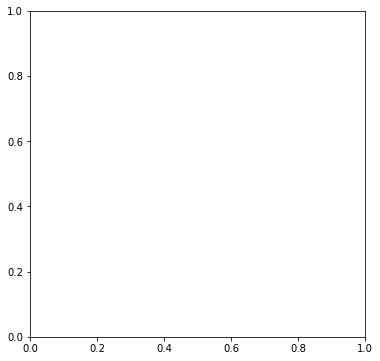

In [80]:
dt_multi = DecisionTreeClassifier(random_state=0, class_weight='balanced', ccp_alpha=0)
list_df, list_accuracy, list_f1score = applyStratifiedKFold(dt_multi, 1)

In [81]:
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()

,f1-score,precision,recall,support
0,0.141897,0.090039,0.336439,122.5
1,0.129232,0.076526,0.415782,111.6
2,0.416316,0.400153,0.434100,791.3
3,0.683082,0.847036,0.572424,2136.7
4,0.680945,0.704758,0.658927,1188.6
5,0.988132,0.991369,0.984921,2845.0
6,0.925873,0.929570,0.922222,4545.0
7,0.831163,0.877853,0.789332,678.3
8,0.620694,0.639567,0.605572,73.3
9,0.710353,0.745079,0.694643,7.7


In [82]:
computeAverageAccuracy(list_accuracy)

Average Accuracy score == 80.13 %


In [83]:
computeAverageF1Score(df_avg)

Average F1-score == 63.01 %


### Logistic Regression multiclass cross-validation

In [ ]:
# one-versus-rest for multiclass classification
logr_classifier = LogisticRegression(dual=False, class_weight='balanced', max_iter=10000, solver='newton-cg', multi_class='ovr', n_jobs=-1)
logr_classifier.fit(train_x, train_y_multi)

In [ ]:
pred_y = logr_classifier.predict(test_x)

In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_multi, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
print(classification_report(test_y_multi, pred_y))

In [ ]:
lr_multi = LogisticRegression(dual=False, class_weight='balanced', max_iter=10000, solver='newton-cg', multi_class='ovr', n_jobs=-1)
list_df, list_accuracy, list_f1score = applyStratifiedKFold(lr_multi, 1)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)

### Linear Support Vector Machine multiclass cross-validation

In [ ]:
# LinearSVC implements “one-vs-the-rest” multi-class strategy, thus training n_classes models
# it scales better than SVC with kernel=linear

# VERY LONG RUNNING TIME


lsvm_multi = LinearSVC(dual=False, class_weight='balanced', max_iter=15000)
# lsvm.fit(train_x, train_y) 
# pred_y = lsvm.predict(test_x)
# print(classification_report(test_y, pred_y))
list_df, list_accuracy, list_f1score = applyStratifiedKFold(lsvm_multi, 1)
df_avg = computeAverageMetrics(list_df)
df_avg.transpose()
computeAverageAccuracy(list_accuracy)
computeAverageF1Score(df_avg)


## Test for class cardinality reduction

In [ ]:
train_y

In [ ]:
train_y_9 = train_y.copy(deep=True)
train_y_9.loc[train_y_9 == 'Backdoor'] = 'Backdoor_or_Dos'
train_y_9.loc[train_y_9 == 'DoS'] = 'Backdoor_or_Dos'


test_y_9 = test_y.copy(deep=True)
test_y_9.loc[test_y_9 == 'Backdoor'] = 'Backdoor_or_Dos'
test_y_9.loc[test_y_9 == 'DoS'] = 'Backdoor_or_Dos'
test_y_9.sample(100)


In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_9)
pred_y = classifier.predict(test_x)
print(classification_report(test_y_9, pred_y))

In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_9, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
train_y_7 = train_y_9.copy(deep=True)
train_y_7.loc[train_y_7 == 'Backdoor_or_Dos'] = 'BADE'
train_y_7.loc[train_y_7 == 'Analysis'] = 'BADE'
train_y_7.loc[train_y_7 == 'Exploits'] = 'BADE'


test_y_7 = test_y_9.copy(deep=True)
test_y_7.loc[test_y_7 == 'Backdoor_or_Dos'] = 'BADE'
test_y_7.loc[test_y_7 == 'Analysis'] = 'BADE'
test_y_7.loc[test_y_7 == 'Exploits'] = 'BADE'

test_y_7.sample(100)


In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_7)
pred_y = classifier.predict(test_x)
print(classification_report(test_y_7, pred_y))


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_7, pred_y, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
train_y_2 = train_y_7.copy(deep=True)
train_y_2.loc[train_y_7 != 'Normal'] = 'Attack'


test_y_2 = test_y_7.copy(deep=True)
test_y_2.loc[test_y_2 != 'Normal'] = 'Attack'


test_y_2.sample(100)

In [ ]:
classifier = DecisionTreeClassifier(random_state=0)
classifier = classifier.fit(train_x, train_y_2)
pred_y_2 = classifier.predict(test_x)
print(classification_report(test_y_2, pred_y_2))


In [ ]:
fig, ax = plt.subplots(figsize=(11, 11))
disp = ConfusionMatrixDisplay.from_predictions(test_y_2, pred_y_2, xticks_rotation='vertical', ax=ax)
plt.show()

In [ ]:
# randf = RandomForestClassifier(class_weight = 'balanced', n_jobs=-1)
# randf.fit(train_x, train_y_2)

# pred_y_2 = randf.predict(test_x)
# print(classification_report(test_y_2, pred_y_2))

mlp = MLPClassifier(random_state=123, solver='adam', max_iter=10000)
mlp.fit(train_x, train_y_2)
pred_y_2 = mlp.predict(test_x)
print(classification_report(test_y_2, pred_y_2))

# Unsupervised Learning

In [ ]:
def evaluate_clustering(y_true, y_pred):
    # Matrix $C$ such that $C_{ij}$ is the number of samples in true class $i$ and in predicted cluster $j$.
    cm = contingency_matrix(y_true, y_pred)
    print(f'contingency matrix: \n {cm}')
    for enu, row in enumerate(cm):
        print(f'Row{enu}: sum = {sum(row)}')    
    homogeneity, completeness, v_measure = homogeneity_completeness_v_measure(y_true, y_pred)
#   homogeneity is high if all the clusters contain only data points which are members of a single class.
    print(f'homogeneity score: {homogeneity}')
#   completeness is high if all the data points that are members of a given class are elements of the same cluster.
    print(f'completeness score: {completeness}')
    print(f'v-measure score: {v_measure}')

In [ ]:
train_y_bin = train_y.apply(lambda x: 'normal' if x == 'Normal' else 'attack')
train_y_bin.value_counts()

In [ ]:

def plot_pca(X,Y):
    # Use PCA to reduce dimensionality so we can visualize the dataset on a 2d plot
    pca = PCA(n_components=2)

    data_pca = pca.fit_transform(X)

    print(f'percentage of variance explained by principal components: {pca.explained_variance_ratio_}')
    print(f'sum: {sum(pca.explained_variance_ratio_)}')

    plt.figure(figsize=(15,10))
    colors = ['navy', 'turquoise', 'darkorange', 'red', 'purple', 'green', 'pink', 'yellow', 'black', 'orange']
    
    for color, cat in zip(colors, np.unique(Y)):
        plt.scatter(data_pca[Y==cat, 0], data_pca[Y==cat, 1],
                    color=color, alpha=.8, lw=2, label=cat)
    plt.legend(loc='best', shadow=False, scatterpoints=1)

    plt.show()

    
# %matplotlib notebook
plot_pca(train_x, train_y)
plot_pca(train_x, train_y_bin)


In [ ]:
def apply_kmeans(X, y, k_values, n_components = 2):
    for k in k_values:
        print(f'k = {k}')
        kmeans = KMeans(n_clusters = k, random_state = 17).fit(X)
        pred_y = kmeans.labels_
        evaluate_clustering(y, pred_y)

        
# If 0 < n_components < 1 and svd_solver == 'full' (automatically selected), 
# select the number of components such that 
# the amount of variance that needs to be explained is greater 
# than the percentage specified by n_components.
for components in [0.95,2,None]: # arguments for the PCA reduction, different cases
    print()
    if components:
        print(components)
        pca = PCA(n_components=components)
        data_clustering = pca.fit_transform(train_x)
    else:
        data_clustering = train_x
    print(f'[transformed] space shape: {data_clustering.shape}')
    apply_kmeans(data_clustering, train_y, [10])
#     apply_kmeans(data_pca,train_y,[8])

In [ ]:
for components in [0.95,2,None]:
    print()
    if components:
        pca = PCA(n_components = components)
        data_clustering = pca.fit_transform(train_x)
    else:
        data_clustering = train_x
    print(f'[transformed] space shape: {data_clustering.shape}')
    apply_kmeans(data_clustering, train_y_bin, [2])

As we can see from the previous results, this dataset is absolutely not suitable for a clustering approach. 
### TODO comments

# Outlier Detection

In [ ]:
train_y.value_counts().index

In [ ]:
final_indices = []
for net_type in train_y.value_counts().index:
    if net_type == 'Normal':
        final_indices.extend(train_y[train_y == net_type].index.values)
    final_indices.extend(train_y[train_y == net_type].sample(10).index.values)
len(final_indices)
train_y_sample = train_y.loc[final_indices]
train_y_bin_sample = train_y_bin.loc[final_indices]
print(train_y_sample.value_counts())
print(train_y_bin_sample.value_counts())
train_x_sample = train_x.loc[final_indices,:]

In [ ]:
def apply_LOF(X, contamination):
    lof = LOF(contamination = contamination)
    y_lof = lof.fit_predict(X)
    unique, counts = np.unique(y_lof, return_counts = True)
    print(dict(zip(unique, counts)))
    pred_y = np.minimum(y_lof,0)*(-1)
    return pred_y

pca = PCA(n_components=0.95)
data_clustering = pca.fit_transform(train_x_sample)

print(f'[transformed] space shape: {data_clustering.shape}')

for contamination in [0.0005, 0.001, 'auto']:
    print('contamination', contamination)
    pred_y = apply_LOF(data_clustering, contamination)
    evaluate_clustering(train_y_sample, pred_y)
    evaluate_clustering(train_y_bin_sample, pred_y)


In [ ]:
train_y_fuzzers = train_y.apply(lambda x: 'outlier' if x == 'Fuzzers' else 'normal')

In [ ]:
pca = PCA(n_components=0.95)
data_clustering = pca.fit_transform(train_x)
print(f'[transformed] space shape: {data_clustering.shape}')

for contamination in [0.0005,'auto']:
    print()
    print('contamination', contamination)
    pred_y = apply_LOF(data_clustering, contamination)
    evaluate_clustering(train_y_fuzzers, pred_y)
